## Instalaciones

In [1]:
%pip install gym stable-baselines3
%pip install numpy
%pip install matplotlib
%pip install ipywidgets
%pip install stable-baselines3[extra]
%pip install sb3-contrib
%pip install optuna


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
zsh:1: no matches found: stable-baselines3[extra]
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3.11 -m pip install

In [2]:
import os
from subprocess import Popen, PIPE
from typing import Tuple

import numpy as np
import matplotlib.pyplot as plt

import torch
import gymnasium as gym
from gymnasium import spaces

from stable_baselines3.common.vec_env import DummyVecEnv, VecVideoRecorder
from stable_baselines3 import DQN, PPO, A2C
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold

os.makedirs('logs', exist_ok=True)

cwd = os.getcwd()

%matplotlib inline
%load_ext tensorboard

## Creación del entorno

Nuestro proyecto va a consistir en crear un laberinto con distintos obstaculos, el objetivo de nuestro agente va a ser llegar a la salida en la menor cantidad de movimientos y maximizando la recompensa: 
* Utilizamos el entorno de gym
* Creamos una grilla de 6x6
* Definimos las acciones posibles
* Establecemos las posiciones de los pozos cuya sanción por caer en ellos va a ser de -10 y volver a la posición de inicio
* Establecemos el numero maximo de pasos en 50
* Hacer un movimiento le va a costar al agente 1
* Llegar a la meta le da una recompensa de 50

In [3]:
class MiLaberinto(gym.Env):
    def __init__(self):
        super(MiLaberinto, self).__init__()
        
        self.shape = (6, 6)  # Tamaño del laberinto (6x6)

        self.observation_space = spaces.Discrete(self.shape[0] * self.shape[1])
        self.action_space = spaces.Discrete(4)  # Movimientos 0: Arriba, 1: Derecha, 2: Abajo, 3: Izquierda

        self.agent_position = (0, 0) #Posición Inicial
        self.target_position = (self.shape[0] - 1, self.shape[1] - 1) #Posición target

        self.pit_positions = [(1, 1), (2, 3), (3, 0), (4, 2), (5, 4)] #Pozos

        self.max_steps = 50 #Número máximo de pasos

        self.current_step = 0 #Contador de pasos

    def reset(self, seed = None):
        self.agent_position = (0, 0)
        self.current_step = 0

        obs = self._get_observation()
        info = {}

        return obs, info
    
    def _get_observation(self):
        # Convertir la posición del agente en una observación discreta
        return self.agent_position[0] * self.shape[1] + self.agent_position[1]

    def step(self, action):
        self.current_step += 1  # Suma un paso

        self._take_action(action)  # Toma Acción

        reward = self._calculate_reward()  # Calcula recompensa

        done = self._is_episode_done()  # Comprueba si el episodio terminó

        obs = self._get_observation()
        info = {}

        return obs, reward, done, False, info


    def _take_action(self, action):
        movements = [(0, 1), (1, 0), (0, -1), (-1, 0)] #Defino movimientos

        # Calculo la nueva posición del agente
        new_position = (
            self.agent_position[0] + movements[action][0],
            self.agent_position[1] + movements[action][1]
        )

        # Verifico si la nueva posición está dentro de los límites del laberinto
        if (0 <= new_position[0] < self.shape[0]) and (0 <= new_position[1] < self.shape[1]):

            self.agent_position = new_position #Actualizo la posición del agente

    def _calculate_reward(self):
        if self.agent_position in self.pit_positions: #Si cae en un pozo resto 10
            return -10 
        elif self.agent_position == self.target_position: #Si llega al final sumo 50
            return 50 
        else:
            return -1  #Resto 1 por moverse

    def _is_episode_done(self):
        # Comprobar si se ha superado el límite de pasos o si el agente llegó al objetivo
        return (
            self.current_step >= self.max_steps
            or self.agent_position == self.target_position
        )

    def render(self, mode="human"):
        if mode == "human":
            # Crear una representación visual del laberinto
            for i in range(self.shape[0]):
                for j in range(self.shape[1]):
                    if (i, j) == self.agent_position:
                        print("A", end=" ")  # Agente
                    elif (i, j) in self.pit_positions:
                        print("P", end=" ")  # Pozo
                    elif (i, j) == self.target_position:
                        print("T", end=" ")  # Objetivo
                    else:
                        print(".", end=" ")  # Espacio vacío
                print() 
            print()
        elif mode == "tensorboard":
            # Crea una matriz que represente el laberinto
            maze = np.full(self.shape, ".", dtype=np.str)

            # Establece la posición del agente en el laberinto
            agent_row, agent_col = self.agent_position
            maze[agent_row, agent_col] = "A"

            # Coloca los pozos en el laberinto
            for pit in self.pit_positions:
                maze[pit[0], pit[1]] = "P"

            # Coloca el objetivo en el laberinto
            maze[self.target_position[0], self.target_position[1]] = "T"

            return maze  # Devuelve la representación del laberinto
            
    def close(self):
        pass

## Pruebas simples con distintos algoritmos

### Activación del entorno

In [ ]:
# validamos que el ambiente cumpla con la interfaz de gym
from stable_baselines3.common.env_checker import check_env

env = MiLaberinto()
# Si el entorno no cumple con la interfaz, se lanzará una excepción
check_env(env, warn=True)

### DQN

In [5]:
modelDQN = DQN("MlpPolicy", env, verbose=1).learn(20000)  

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 50       |
|    ep_rew_mean      | -108     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 30926    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 43.8     |
|    ep_rew_mean      | -77.5    |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 27757    |
|    time_elapsed     | 0        |
|    total_timesteps  | 350      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 43.6     |
|    ep_rew_mean      | -84.3  

Insights:
* La longitud media de los episodios disminuye poco.
* La recompensa media por episodio no mejora mucha a lo largo de los episodios.

### PPO

In [6]:
modelPPO = PPO("MlpPolicy", env, verbose=1).learn(20000)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 44.7     |
|    ep_rew_mean     | -90.1    |
| time/              |          |
|    fps             | 5678     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 43.6         |
|    ep_rew_mean          | -79.4        |
| time/                   |              |
|    fps                  | 3708         |
|    iterations           | 2            |
|    time_elapsed         | 1            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0053641223 |
|    clip_fraction        | 0.00405      |
|    clip_range           | 0.2          |
|    en

Insights:
*  La longitud media de los episodios disminuye a medida que el agente aprende a completar el laberinto de manera más eficiente.
* La recompensa media por episodio mejora sustancialmente a lo largo de los episodios.
* La pérdida de valor se reduce muchisimo

Podemos decir que este algoritmo funciona mejor que PPO

### A2C

In [7]:
modelA2C = A2C("MlpPolicy", env, verbose=1).learn(20000) 

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
------------------------------------
| rollout/              |          |
|    ep_len_mean        | 47.7     |
|    ep_rew_mean        | -93.3    |
| time/                 |          |
|    fps                | 2941     |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | -0.00576 |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | -13      |
|    value_loss         | 115      |
------------------------------------
------------------------------------
| rollout/              |          |
|    ep_len_mean        | 46.2     |
|    ep_rew_mean        | -93.9    |
| time/                 |          |
|    fps                | 2960     |
|    iterations         | 200      |
|    time_elapsed 

Insights:
*  La longitud media de los episodios disminuye a medida que el agente aprende a completar el laberinto de manera más eficiente.
* La recompensa media por episodio mejora sustancialmente a lo largo de los episodios.
* La pérdida de valor se reduce muchisimo

Podemos decir que performa ligeramente mejor que PPO y se obtienen resultados interesante

## Mayor desarrollo de los algoritmos

### Activación del entorno

In [4]:
env = DummyVecEnv([lambda: MiLaberinto()])

### Cantidad de pasos

In [5]:
total_timesteps = 20000

### DQN

In [19]:
eval_callback_dqn = EvalCallback(env, best_model_save_path='./pruebas/dqn/',
                             log_path='./pruebas/dqn/', eval_freq=1000,
                             deterministic=True)

In [23]:
modelDQN = DQN("MlpPolicy", env, verbose=3)
modelDQN.learn(total_timesteps, callback=eval_callback_dqn)

Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 16832    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 15881    |
|    time_elapsed     | 0        |
|    total_timesteps  | 368      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 11936    |
|    time_elapsed     | 0        |
|    total_timesteps  | 558      |
----------------------------------
----------------------------------
| r

In [24]:
evaluations = np.load('./pruebas/dqn/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-59. -59. -59. -59. -59.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. 

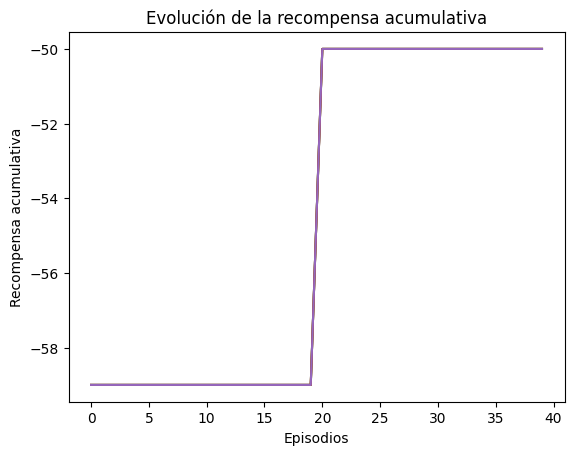

In [25]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

#### Optimización de hiperparametros

In [26]:
env = DummyVecEnv([lambda: MiLaberinto()])

In [29]:
import optuna

def train_agent_with_hyperparameters(trial):
    # Defino un par de hiperparametros a testear
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True)
    buffer_size = trial.suggest_int("buffer_size", 1000, 100000)
    batch_size = trial.suggest_int("batch_size", 16, 256)
    policy_kwargs = dict(net_arch=[trial.suggest_int("n_hidden", 32, 512)])

    env = DummyVecEnv([lambda: MiLaberinto()])

    model = DQN("MlpPolicy", env, verbose=3, learning_rate=learning_rate, buffer_size=buffer_size, batch_size=batch_size, policy_kwargs=policy_kwargs)
    model.learn(total_timesteps=20000)

    mean_reward, _ = evaluate_policy(model, env, n_eval_episodes=10)
    
    return mean_reward

if __name__ == "__main__":
    study = optuna.create_study(direction="maximize")
    study.optimize(train_agent_with_hyperparameters, n_trials=50)

    print("Best trial:")
    best_trial = study.best_trial
    print("  Value: {}".format(best_trial.value))
    print("  Params: ")
    for key, value in best_trial.params.items():
        print("    {}: {}".format(key, value))

[I 2023-10-30 23:32:45,214] A new study created in memory with name: no-name-1e8db182-ed04-457d-90d7-58e54c0b3b10


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 31693    |
|    time_elapsed     | 0        |
|    total_timesteps  | 181      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 28823    |
|    time_elapsed     | 0        |
|    total_timesteps  | 375      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 24738    |
|    time_elapsed     | 0        |
|    total_timesteps  | 566      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:46,232] Trial 0 finished with value: -50.0 and parameters: {'learning_rate': 1.590190567582918e-05, 'buffer_size': 42965, 'batch_size': 132, 'n_hidden': 215}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 18616    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 19017    |
|    time_elapsed     | 0        |
|    total_timesteps  | 368      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 19379    |
|    time_elapsed     | 0        |
|    total_timesteps  | 550      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:47,214] Trial 1 finished with value: -50.0 and parameters: {'learning_rate': 7.911571284023637e-05, 'buffer_size': 96888, 'batch_size': 38, 'n_hidden': 405}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 20350    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 20375    |
|    time_elapsed     | 0        |
|    total_timesteps  | 390      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 12       |
|    fps              | 19867    |
|    time_elapsed     | 0        |
|    total_timesteps  | 569      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:48,170] Trial 2 finished with value: -50.0 and parameters: {'learning_rate': 1.1418911462806432e-05, 'buffer_size': 6150, 'batch_size': 219, 'n_hidden': 474}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 26028    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 23689    |
|    time_elapsed     | 0        |
|    total_timesteps  | 399      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23402    |
|    time_elapsed     | 0        |
|    total_timesteps  | 597      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:49,305] Trial 3 finished with value: -59.0 and parameters: {'learning_rate': 1.9929646308669918e-05, 'buffer_size': 10672, 'batch_size': 197, 'n_hidden': 489}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 29620    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 22857    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23669    |
|    time_elapsed     | 0        |
|    total_timesteps  | 600      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:50,245] Trial 4 finished with value: -50.0 and parameters: {'learning_rate': 0.003175255360927887, 'buffer_size': 98002, 'batch_size': 41, 'n_hidden': 172}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 26845    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25708    |
|    time_elapsed     | 0        |
|    total_timesteps  | 373      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23179    |
|    time_elapsed     | 0        |
|    total_timesteps  | 573      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:51,163] Trial 5 finished with value: -50.0 and parameters: {'learning_rate': 0.00022443964510408175, 'buffer_size': 31381, 'batch_size': 90, 'n_hidden': 457}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34217    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 27378    |
|    time_elapsed     | 0        |
|    total_timesteps  | 389      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 25590    |
|    time_elapsed     | 0        |
|    total_timesteps  | 563      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:52,120] Trial 6 finished with value: -50.0 and parameters: {'learning_rate': 0.0007066832242465458, 'buffer_size': 10736, 'batch_size': 215, 'n_hidden': 320}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33594    |
|    time_elapsed     | 0        |
|    total_timesteps  | 189      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 23667    |
|    time_elapsed     | 0        |
|    total_timesteps  | 388      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 22360    |
|    time_elapsed     | 0        |
|    total_timesteps  | 581      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:53,131] Trial 7 finished with value: -50.0 and parameters: {'learning_rate': 0.0013967382023911301, 'buffer_size': 32644, 'batch_size': 71, 'n_hidden': 171}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 19661    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 21639    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 22173    |
|    time_elapsed     | 0        |
|    total_timesteps  | 592      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:54,076] Trial 8 finished with value: -257.0 and parameters: {'learning_rate': 0.00018249847004507235, 'buffer_size': 53696, 'batch_size': 251, 'n_hidden': 269}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 25596    |
|    time_elapsed     | 0        |
|    total_timesteps  | 192      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25694    |
|    time_elapsed     | 0        |
|    total_timesteps  | 383      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23457    |
|    time_elapsed     | 0        |
|    total_timesteps  | 547      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:55,059] Trial 9 finished with value: -50.0 and parameters: {'learning_rate': 1.9070733104557554e-05, 'buffer_size': 70427, 'batch_size': 16, 'n_hidden': 105}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33442    |
|    time_elapsed     | 0        |
|    total_timesteps  | 183      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 27476    |
|    time_elapsed     | 0        |
|    total_timesteps  | 367      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 24611    |
|    time_elapsed     | 0        |
|    total_timesteps  | 567      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:55,967] Trial 10 finished with value: -50.0 and parameters: {'learning_rate': 5.858744313711556e-05, 'buffer_size': 70673, 'batch_size': 144, 'n_hidden': 281}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33041    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25400    |
|    time_elapsed     | 0        |
|    total_timesteps  | 376      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 24978    |
|    time_elapsed     | 0        |
|    total_timesteps  | 553      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:56,867] Trial 11 finished with value: -50.0 and parameters: {'learning_rate': 7.075481131872533e-05, 'buffer_size': 93293, 'batch_size': 136, 'n_hidden': 375}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 26162    |
|    time_elapsed     | 0        |
|    total_timesteps  | 189      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 22532    |
|    time_elapsed     | 0        |
|    total_timesteps  | 369      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 12       |
|    fps              | 21920    |
|    time_elapsed     | 0        |
|    total_timesteps  | 569      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:57,758] Trial 12 finished with value: -50.0 and parameters: {'learning_rate': 5.181684116796975e-05, 'buffer_size': 47232, 'batch_size': 115, 'n_hidden': 384}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.919    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 28619    |
|    time_elapsed     | 0        |
|    total_timesteps  | 171      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 27896    |
|    time_elapsed     | 0        |
|    total_timesteps  | 358      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 26585    |
|    time_elapsed     | 0        |
|    total_timesteps  | 558      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:58,695] Trial 13 finished with value: -50.0 and parameters: {'learning_rate': 0.006846136042746003, 'buffer_size': 64451, 'batch_size': 171, 'n_hidden': 43}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33812    |
|    time_elapsed     | 0        |
|    total_timesteps  | 181      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25154    |
|    time_elapsed     | 0        |
|    total_timesteps  | 371      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23553    |
|    time_elapsed     | 0        |
|    total_timesteps  | 534      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:32:59,615] Trial 14 finished with value: -50.0 and parameters: {'learning_rate': 1.1040529470604204e-05, 'buffer_size': 82538, 'batch_size': 66, 'n_hidden': 207}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 32221    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 24437    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 24477    |
|    time_elapsed     | 0        |
|    total_timesteps  | 598      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:00,612] Trial 15 finished with value: -50.0 and parameters: {'learning_rate': 0.00010337118914315998, 'buffer_size': 33404, 'batch_size': 104, 'n_hidden': 398}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33439    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 28322    |
|    time_elapsed     | 0        |
|    total_timesteps  | 370      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 27431    |
|    time_elapsed     | 0        |
|    total_timesteps  | 552      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:01,573] Trial 16 finished with value: -50.0 and parameters: {'learning_rate': 3.4660645539558776e-05, 'buffer_size': 47364, 'batch_size': 39, 'n_hidden': 240}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 25813    |
|    time_elapsed     | 0        |
|    total_timesteps  | 196      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25347    |
|    time_elapsed     | 0        |
|    total_timesteps  | 396      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 24153    |
|    time_elapsed     | 0        |
|    total_timesteps  | 595      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:02,562] Trial 17 finished with value: -50.0 and parameters: {'learning_rate': 0.00010741681046550003, 'buffer_size': 84153, 'batch_size': 164, 'n_hidden': 326}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34141    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25598    |
|    time_elapsed     | 0        |
|    total_timesteps  | 372      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23428    |
|    time_elapsed     | 0        |
|    total_timesteps  | 535      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:03,509] Trial 18 finished with value: -59.0 and parameters: {'learning_rate': 2.827645955934644e-05, 'buffer_size': 23048, 'batch_size': 66, 'n_hidden': 117}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 30402    |
|    time_elapsed     | 0        |
|    total_timesteps  | 195      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 28250    |
|    time_elapsed     | 0        |
|    total_timesteps  | 395      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 26329    |
|    time_elapsed     | 0        |
|    total_timesteps  | 595      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:04,462] Trial 19 finished with value: -257.0 and parameters: {'learning_rate': 0.0004109709654696603, 'buffer_size': 57272, 'batch_size': 21, 'n_hidden': 414}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 32049    |
|    time_elapsed     | 0        |
|    total_timesteps  | 183      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25414    |
|    time_elapsed     | 0        |
|    total_timesteps  | 359      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 20833    |
|    time_elapsed     | 0        |
|    total_timesteps  | 544      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:05,411] Trial 20 finished with value: -50.0 and parameters: {'learning_rate': 3.857074100733581e-05, 'buffer_size': 40321, 'batch_size': 126, 'n_hidden': 333}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 31464    |
|    time_elapsed     | 0        |
|    total_timesteps  | 156      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 29267    |
|    time_elapsed     | 0        |
|    total_timesteps  | 346      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 27143    |
|    time_elapsed     | 0        |
|    total_timesteps  | 540      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:06,363] Trial 21 finished with value: -50.0 and parameters: {'learning_rate': 1.2067794918398872e-05, 'buffer_size': 5409, 'batch_size': 241, 'n_hidden': 449}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34423    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 24615    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 25180    |
|    time_elapsed     | 0        |
|    total_timesteps  | 591      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:07,298] Trial 22 finished with value: -50.0 and parameters: {'learning_rate': 1.1609743795166666e-05, 'buffer_size': 17212, 'batch_size': 199, 'n_hidden': 502}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33727    |
|    time_elapsed     | 0        |
|    total_timesteps  | 194      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 23696    |
|    time_elapsed     | 0        |
|    total_timesteps  | 394      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23329    |
|    time_elapsed     | 0        |
|    total_timesteps  | 568      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:08,270] Trial 23 finished with value: -275.0 and parameters: {'learning_rate': 2.2751762283988674e-05, 'buffer_size': 22617, 'batch_size': 158, 'n_hidden': 468}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34385    |
|    time_elapsed     | 0        |
|    total_timesteps  | 182      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 24996    |
|    time_elapsed     | 0        |
|    total_timesteps  | 382      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 25854    |
|    time_elapsed     | 0        |
|    total_timesteps  | 540      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:09,217] Trial 24 finished with value: -266.0 and parameters: {'learning_rate': 1.99428349827189e-05, 'buffer_size': 81606, 'batch_size': 186, 'n_hidden': 512}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 22946    |
|    time_elapsed     | 0        |
|    total_timesteps  | 190      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 21395    |
|    time_elapsed     | 0        |
|    total_timesteps  | 390      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 20631    |
|    time_elapsed     | 0        |
|    total_timesteps  | 585      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:10,210] Trial 25 finished with value: -50.0 and parameters: {'learning_rate': 4.1750304684011594e-05, 'buffer_size': 60998, 'batch_size': 224, 'n_hidden': 353}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34269    |
|    time_elapsed     | 0        |
|    total_timesteps  | 177      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25730    |
|    time_elapsed     | 0        |
|    total_timesteps  | 377      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 24018    |
|    time_elapsed     | 0        |
|    total_timesteps  | 577      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:11,150] Trial 26 finished with value: -50.0 and parameters: {'learning_rate': 8.713213926607868e-05, 'buffer_size': 41220, 'batch_size': 100, 'n_hidden': 427}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33413    |
|    time_elapsed     | 0        |
|    total_timesteps  | 180      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 29126    |
|    time_elapsed     | 0        |
|    total_timesteps  | 379      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 25480    |
|    time_elapsed     | 0        |
|    total_timesteps  | 574      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:12,106] Trial 27 finished with value: -59.0 and parameters: {'learning_rate': 1.0378515335365286e-05, 'buffer_size': 2356, 'batch_size': 83, 'n_hidden': 279}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34201    |
|    time_elapsed     | 0        |
|    total_timesteps  | 193      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 28863    |
|    time_elapsed     | 0        |
|    total_timesteps  | 393      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 26205    |
|    time_elapsed     | 0        |
|    total_timesteps  | 545      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:13,041] Trial 28 finished with value: -50.0 and parameters: {'learning_rate': 3.121778782204746e-05, 'buffer_size': 23174, 'batch_size': 226, 'n_hidden': 193}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34139    |
|    time_elapsed     | 0        |
|    total_timesteps  | 175      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.83     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 27710    |
|    time_elapsed     | 0        |
|    total_timesteps  | 357      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 22106    |
|    time_elapsed     | 0        |
|    total_timesteps  | 557      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:14,004] Trial 29 finished with value: -50.0 and parameters: {'learning_rate': 1.5820425037815176e-05, 'buffer_size': 13048, 'batch_size': 188, 'n_hidden': 474}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 24715    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 23572    |
|    time_elapsed     | 0        |
|    total_timesteps  | 365      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 22678    |
|    time_elapsed     | 0        |
|    total_timesteps  | 551      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:14,967] Trial 30 finished with value: -59.0 and parameters: {'learning_rate': 2.4829973756863458e-05, 'buffer_size': 74132, 'batch_size': 48, 'n_hidden': 235}. Best is trial 0 with value: -50.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34357    |
|    time_elapsed     | 0        |
|    total_timesteps  | 180      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 31927    |
|    time_elapsed     | 0        |
|    total_timesteps  | 380      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 21420    |
|    time_elapsed     | 0        |
|    total_timesteps  | 580      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:15,857] Trial 31 finished with value: 41.0 and parameters: {'learning_rate': 2.007497865842712e-05, 'buffer_size': 95552, 'batch_size': 36, 'n_hidden': 146}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34077    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 28785    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 25346    |
|    time_elapsed     | 0        |
|    total_timesteps  | 600      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:16,782] Trial 32 finished with value: -59.0 and parameters: {'learning_rate': 1.6879832070755838e-05, 'buffer_size': 97802, 'batch_size': 36, 'n_hidden': 121}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 18428    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 18951    |
|    time_elapsed     | 0        |
|    total_timesteps  | 354      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 16192    |
|    time_elapsed     | 0        |
|    total_timesteps  | 539      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:17,771] Trial 33 finished with value: -50.0 and parameters: {'learning_rate': 4.3025152617112635e-05, 'buffer_size': 90068, 'batch_size': 55, 'n_hidden': 152}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 25319    |
|    time_elapsed     | 0        |
|    total_timesteps  | 194      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 26032    |
|    time_elapsed     | 0        |
|    total_timesteps  | 394      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 24071    |
|    time_elapsed     | 0        |
|    total_timesteps  | 574      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:18,751] Trial 34 finished with value: -50.0 and parameters: {'learning_rate': 1.5998587920513273e-05, 'buffer_size': 88326, 'batch_size': 79, 'n_hidden': 49}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.909    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33985    |
|    time_elapsed     | 0        |
|    total_timesteps  | 191      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 30668    |
|    time_elapsed     | 0        |
|    total_timesteps  | 364      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 27637    |
|    time_elapsed     | 0        |
|    total_timesteps  | 557      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:19,730] Trial 35 finished with value: -50.0 and parameters: {'learning_rate': 2.6258125504801642e-05, 'buffer_size': 99660, 'batch_size': 149, 'n_hidden': 140}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 20076    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 20538    |
|    time_elapsed     | 0        |
|    total_timesteps  | 374      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 22169    |
|    time_elapsed     | 0        |
|    total_timesteps  | 574      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:20,697] Trial 36 finished with value: -59.0 and parameters: {'learning_rate': 5.2959142845669333e-05, 'buffer_size': 75935, 'batch_size': 31, 'n_hidden': 220}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34199    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 23114    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 16071    |
|    time_elapsed     | 0        |
|    total_timesteps  | 600      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:21,704] Trial 37 finished with value: -59.0 and parameters: {'learning_rate': 0.00014322585928597148, 'buffer_size': 64757, 'batch_size': 54, 'n_hidden': 169}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 34441    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 30564    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 29112    |
|    time_elapsed     | 0        |
|    total_timesteps  | 600      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:22,689] Trial 38 finished with value: -50.0 and parameters: {'learning_rate': 6.0615840911208466e-05, 'buffer_size': 37434, 'batch_size': 98, 'n_hidden': 79}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 29163    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 24557    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23222    |
|    time_elapsed     | 0        |
|    total_timesteps  | 600      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:23,653] Trial 39 finished with value: -50.0 and parameters: {'learning_rate': 1.5403843250294456e-05, 'buffer_size': 93892, 'batch_size': 122, 'n_hidden': 438}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33904    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25467    |
|    time_elapsed     | 0        |
|    total_timesteps  | 396      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 20781    |
|    time_elapsed     | 0        |
|    total_timesteps  | 577      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:24,723] Trial 40 finished with value: -50.0 and parameters: {'learning_rate': 2.3134281757309872e-05, 'buffer_size': 51042, 'batch_size': 200, 'n_hidden': 302}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 27628    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 18029    |
|    time_elapsed     | 0        |
|    total_timesteps  | 368      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 12       |
|    fps              | 18478    |
|    time_elapsed     | 0        |
|    total_timesteps  | 568      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:25,692] Trial 41 finished with value: -50.0 and parameters: {'learning_rate': 0.0006796541421246303, 'buffer_size': 92578, 'batch_size': 31, 'n_hidden': 181}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 28769    |
|    time_elapsed     | 0        |
|    total_timesteps  | 195      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 24946    |
|    time_elapsed     | 0        |
|    total_timesteps  | 388      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 18473    |
|    time_elapsed     | 0        |
|    total_timesteps  | 587      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:26,673] Trial 42 finished with value: -50.0 and parameters: {'learning_rate': 0.0027252439512151453, 'buffer_size': 96528, 'batch_size': 18, 'n_hidden': 252}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 31820    |
|    time_elapsed     | 0        |
|    total_timesteps  | 190      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 18989    |
|    time_elapsed     | 0        |
|    total_timesteps  | 364      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 13778    |
|    time_elapsed     | 0        |
|    total_timesteps  | 564      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:27,664] Trial 43 finished with value: -50.0 and parameters: {'learning_rate': 0.00024829923658244846, 'buffer_size': 86675, 'batch_size': 46, 'n_hidden': 155}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33967    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 25588    |
|    time_elapsed     | 0        |
|    total_timesteps  | 377      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 23958    |
|    time_elapsed     | 0        |
|    total_timesteps  | 577      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:28,634] Trial 44 finished with value: -50.0 and parameters: {'learning_rate': 7.103797749225846e-05, 'buffer_size': 77208, 'batch_size': 255, 'n_hidden': 78}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 12994    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 17129    |
|    time_elapsed     | 0        |
|    total_timesteps  | 368      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 12       |
|    fps              | 17118    |
|    time_elapsed     | 0        |
|    total_timesteps  | 568      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:29,637] Trial 45 finished with value: -59.0 and parameters: {'learning_rate': 0.00016758654028033667, 'buffer_size': 69020, 'batch_size': 63, 'n_hidden': 207}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 33552    |
|    time_elapsed     | 0        |
|    total_timesteps  | 163      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 23720    |
|    time_elapsed     | 0        |
|    total_timesteps  | 363      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 21232    |
|    time_elapsed     | 0        |
|    total_timesteps  | 563      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:30,625] Trial 46 finished with value: -50.0 and parameters: {'learning_rate': 4.072321625623475e-05, 'buffer_size': 30104, 'batch_size': 73, 'n_hidden': 265}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 20557    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 20889    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 21557    |
|    time_elapsed     | 0        |
|    total_timesteps  | 554      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:31,621] Trial 47 finished with value: -50.0 and parameters: {'learning_rate': 3.0513655033604873e-05, 'buffer_size': 78394, 'batch_size': 135, 'n_hidden': 481}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 20000    |
|    time_elapsed     | 0        |
|    total_timesteps  | 180      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 22364    |
|    time_elapsed     | 0        |
|    total_timesteps  | 380      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 22490    |
|    time_elapsed     | 0        |
|    total_timesteps  | 558      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:32,604] Trial 48 finished with value: -50.0 and parameters: {'learning_rate': 1.3218719510487722e-05, 'buffer_size': 92135, 'batch_size': 86, 'n_hidden': 367}. Best is trial 31 with value: 41.0.


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 25128    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 16779    |
|    time_elapsed     | 0        |
|    total_timesteps  | 379      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 16253    |
|    time_elapsed     | 0        |
|    total_timesteps  | 570      |
----------------------------------
----------------------------------
| r

[I 2023-10-30 23:33:33,604] Trial 49 finished with value: -50.0 and parameters: {'learning_rate': 1.876894078661554e-05, 'buffer_size': 85797, 'batch_size': 28, 'n_hidden': 300}. Best is trial 31 with value: 41.0.


Best trial:
  Value: 41.0
  Params: 
    learning_rate: 2.007497865842712e-05
    buffer_size: 95552
    batch_size: 36
    n_hidden: 146


Hiperparametros que optimizan el algoritmo:

In [30]:
best_learning_rate = 0.00002007497865842712
best_buffer_size = 95552
best_batch_size = 36
best_n_hidden = 146

In [31]:
eval_callback_dqn = EvalCallback(env, best_model_save_path='./pruebas/dqn/optimizado/',
                             log_path='./pruebas/dqn/optimizado/', eval_freq=1000,
                             deterministic=True)

In [32]:
modelDQN = DQN("MlpPolicy", env, verbose=3, learning_rate=best_learning_rate, buffer_size=best_buffer_size, batch_size=best_batch_size, policy_kwargs=dict(net_arch=[best_n_hidden]))
modelDQN.learn(total_timesteps, callback=eval_callback_dqn)

Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 12573    |
|    time_elapsed     | 0        |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 8        |
|    fps              | 14145    |
|    time_elapsed     | 0        |
|    total_timesteps  | 400      |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 15869    |
|    time_elapsed     | 0        |
|    total_timesteps  | 576      |
----------------------------------
----------------------------------
| r

In [33]:
evaluations = np.load('./pruebas/dqn/optimizado/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]]
Longitud de episodios: [[50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]]


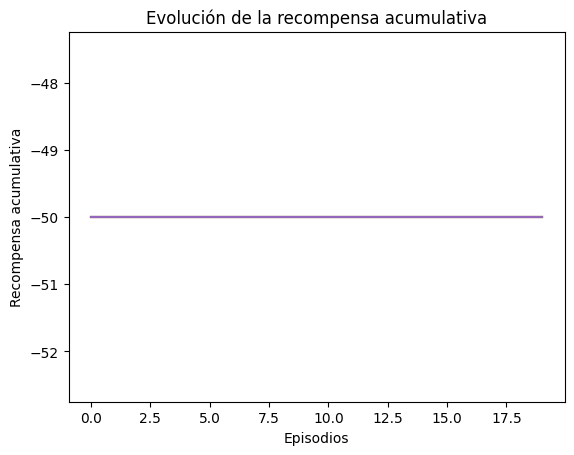

In [34]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

Nota: no entiendo por que si aplico la funcion llego a recompensas distintas pero cuando quiero aplicarlo por fuera de la funcion de optimizacion da todo -50

### PPO

In [35]:
eval_callback_ppo = EvalCallback(env, best_model_save_path='./pruebas/ppo/',
                             log_path='./pruebas/ppo/', eval_freq=1000,
                             deterministic=True, render=False)

In [36]:
modelPPO = PPO("MlpPolicy", env, verbose=1)
modelPPO.learn(total_timesteps, callback=eval_callback_ppo)

Using cpu device
Eval num_timesteps=1000, episode_reward=-50.00 +/- 0.00
Episode length: 50.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 50       |
|    mean_reward     | -50      |
| time/              |          |
|    total_timesteps | 1000     |
---------------------------------
New best mean reward!
Eval num_timesteps=2000, episode_reward=-50.00 +/- 0.00
Episode length: 50.00 +/- 0.00
---------------------------------
| eval/              |          |
|    mean_ep_length  | 50       |
|    mean_reward     | -50      |
| time/              |          |
|    total_timesteps | 2000     |
---------------------------------
-----------------------------
| time/              |      |
|    fps             | 2754 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 2048 |
-----------------------------
Eval num_timesteps=3000, episode_reward=-50.00 +/- 0.00
Episode length: 50.00 +/- 0.00
--------------

In [37]:
evaluations = np.load('./pruebas/ppo/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]]
Longitud de episodios: [[50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]]


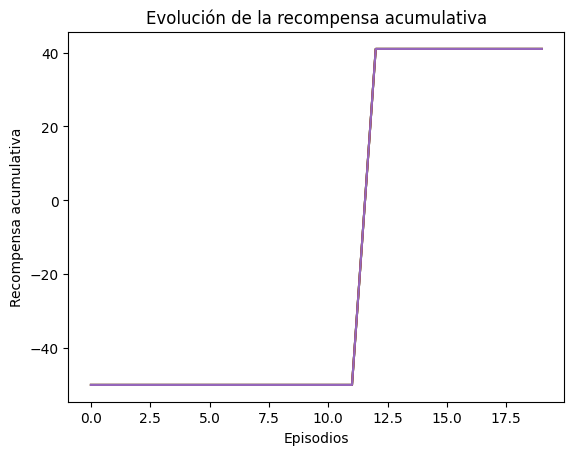

In [38]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

#### Optimización de hiperparametros

In [45]:
def train_agent_with_hyperparameters(trial):
    # Defino los hiperparámetros a optimizar
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True)
    n_steps = trial.suggest_int("n_steps", 16, 2048, log=True)
    ent_coef = trial.suggest_float("ent_coef", 0.0, 0.01)
    policy_kwargs = {
        "net_arch": [trial.suggest_int("n_hidden", 32, 512)]
    }

    env = DummyVecEnv([lambda: MiLaberinto()])

    model = PPO("MlpPolicy", env, verbose=1, learning_rate=learning_rate, n_steps=n_steps, ent_coef=ent_coef, policy_kwargs=policy_kwargs)

    model.learn(total_timesteps=20000)

    mean_reward, _ = evaluate_policy(model, env, n_eval_episodes=10)

    return mean_reward

if __name__ == "__main__":
    study = optuna.create_study(direction="maximize")
    study.optimize(train_agent_with_hyperparameters, n_trials=50)

    print("Best trial:")
    best_trial = study.best_trial
    print("  Value: {}".format(best_trial.value))
    print("  Params: ")
    for key, value in best_trial.params.items():
        print("    {}: {}".format(key, value))


[I 2023-10-30 23:50:23,816] A new study created in memory with name: no-name-f07d7e9e-98f6-4b9e-aac7-08b802d1a0f4
/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 1974`, after every 30 untruncated mini-batches, there will be a truncated mini-batch of size 54
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1974 and n_envs=1)
  warnings.warn(


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3511 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 1974 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1998        |
|    iterations           | 2           |
|    time_elapsed         | 1           |
|    total_timesteps      | 3948        |
| train/                  |             |
|    approx_kl            | 7.69452e-05 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.00151     |
|    learning_rate        | 3.12e-05    |
|    loss                 | 511         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00159    |
|    value_loss           | 934         |
-----------------------------------------
-----------------

[I 2023-10-30 23:50:36,584] Trial 0 finished with value: -50.0 and parameters: {'learning_rate': 3.124555538603972e-05, 'n_steps': 1974, 'ent_coef': 0.0060412648525923675, 'n_hidden': 452}. Best is trial 0 with value: -50.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3590 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 57   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 2227         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 114          |
| train/                  |              |
|    approx_kl            | 6.685968e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.00108      |
|    learning_rate        | 0.000312     |
|    loss                 | 255          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00439     |
|    value_loss           | 512          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 57`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 57
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=57 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1802         |
|    iterations           | 7            |
|    time_elapsed         | 0            |
|    total_timesteps      | 399          |
| train/                  |              |
|    approx_kl            | 8.654176e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.000966    |
|    learning_rate        | 0.000312     |
|    loss                 | 413          |
|    n_updates            | 60           |
|    policy_gradient_loss | -0.000607    |
|    value_loss           | 829          |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1785          |
|    iterations           | 8             |
|    time_elapsed         | 0             |
|    t

[I 2023-10-30 23:50:48,597] Trial 1 finished with value: 41.0 and parameters: {'learning_rate': 0.0003118942004949805, 'n_steps': 57, 'ent_coef': 0.0040128486445500525, 'n_hidden': 169}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3256 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 47   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1147         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 94           |
| train/                  |              |
|    approx_kl            | 5.306462e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.000317    |
|    learning_rate        | 0.000142     |
|    loss                 | 302          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00425     |
|    value_loss           | 605          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 47`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 47
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=47 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1209         |
|    iterations           | 5            |
|    time_elapsed         | 0            |
|    total_timesteps      | 235          |
| train/                  |              |
|    approx_kl            | 2.399404e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.000761    |
|    learning_rate        | 0.000142     |
|    loss                 | 229          |
|    n_updates            | 40           |
|    policy_gradient_loss | -0.00217     |
|    value_loss           | 458          |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1236          |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    t

[I 2023-10-30 23:51:03,695] Trial 2 finished with value: 41.0 and parameters: {'learning_rate': 0.0001424382091415367, 'n_steps': 47, 'ent_coef': 0.009963041720052915, 'n_hidden': 499}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3647 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 479  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 479`, after every 7 untruncated mini-batches, there will be a truncated mini-batch of size 31
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=479 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 2394          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 958           |
| train/                  |               |
|    approx_kl            | 0.00017354877 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.000666     |
|    learning_rate        | 0.000145      |
|    loss                 | 249           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.0043       |
|    value_loss           | 623           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 2074          |
|    iterations           | 3             |
|    time_elapsed         | 0   

[I 2023-10-30 23:51:14,809] Trial 3 finished with value: 41.0 and parameters: {'learning_rate': 0.00014473207138945574, 'n_steps': 479, 'ent_coef': 0.007730145530830159, 'n_hidden': 344}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3748 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 135  |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 2224          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 270           |
| train/                  |               |
|    approx_kl            | 1.4063548e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00357       |
|    learning_rate        | 7.32e-05      |
|    loss                 | 589           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00114      |
|    value_loss           | 935           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 135`, after every 2 untruncated mini-batches, there will be a truncated mini-batch of size 7
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=135 and n_envs=1)
  warnings.warn(


-----------------------------------------
| time/                   |             |
|    fps                  | 1966        |
|    iterations           | 3           |
|    time_elapsed         | 0           |
|    total_timesteps      | 405         |
| train/                  |             |
|    approx_kl            | 5.97612e-06 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -0.00124    |
|    learning_rate        | 7.32e-05    |
|    loss                 | 380         |
|    n_updates            | 20          |
|    policy_gradient_loss | -0.000832   |
|    value_loss           | 751         |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1746          |
|    iterations           | 4             |
|    time_elapsed         | 0             |
|    total_timesteps    

[I 2023-10-30 23:51:27,752] Trial 4 finished with value: -50.0 and parameters: {'learning_rate': 7.321027276100748e-05, 'n_steps': 135, 'ent_coef': 0.008313269017200718, 'n_hidden': 189}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3641 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 97   |
-----------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 2002       |
|    iterations           | 2          |
|    time_elapsed         | 0          |
|    total_timesteps      | 194        |
| train/                  |            |
|    approx_kl            | 0.03924283 |
|    clip_fraction        | 0.367      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.37      |
|    explained_variance   | -0.00155   |
|    learning_rate        | 0.0049     |
|    loss                 | 230        |
|    n_updates            | 10         |
|    policy_gradient_loss | -0.0788    |
|    value_loss           | 854        |
----------------------------------------
-----------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 97`, after every 1 untruncated mini-batches, there will be a truncated mini-batch of size 33
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=97 and n_envs=1)
  warnings.warn(


---------------------------------------
| time/                   |           |
|    fps                  | 1696      |
|    iterations           | 4         |
|    time_elapsed         | 0         |
|    total_timesteps      | 388       |
| train/                  |           |
|    approx_kl            | 0.0787348 |
|    clip_fraction        | 0.486     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.25     |
|    explained_variance   | -0.00436  |
|    learning_rate        | 0.0049    |
|    loss                 | 160       |
|    n_updates            | 30        |
|    policy_gradient_loss | -0.0658   |
|    value_loss           | 354       |
---------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 1619       |
|    iterations           | 5          |
|    time_elapsed         | 0          |
|    total_timesteps      | 485        |
| train/                  |       

[I 2023-10-30 23:51:42,324] Trial 5 finished with value: -50.0 and parameters: {'learning_rate': 0.0049013172254045835, 'n_steps': 97, 'ent_coef': 0.003284499128318992, 'n_hidden': 511}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3604 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 147  |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1934         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 294          |
| train/                  |              |
|    approx_kl            | 0.0017607656 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.000268    |
|    learning_rate        | 0.000562     |
|    loss                 | 294          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.0136      |
|    value_loss           | 714          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 147`, after every 2 untruncated mini-batches, there will be a truncated mini-batch of size 19
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=147 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1767         |
|    iterations           | 3            |
|    time_elapsed         | 0            |
|    total_timesteps      | 441          |
| train/                  |              |
|    approx_kl            | 0.0016025404 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.0045       |
|    learning_rate        | 0.000562     |
|    loss                 | 249          |
|    n_updates            | 20           |
|    policy_gradient_loss | -0.00988     |
|    value_loss           | 527          |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1561          |
|    iterations           | 4             |
|    time_elapsed         | 0             |
|    t

[I 2023-10-30 23:51:55,331] Trial 6 finished with value: -50.0 and parameters: {'learning_rate': 0.0005623696469386548, 'n_steps': 147, 'ent_coef': 0.009708834029378917, 'n_hidden': 365}. Best is trial 1 with value: 41.0.


Using cpu device


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 1417`, after every 22 untruncated mini-batches, there will be a truncated mini-batch of size 9
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1417 and n_envs=1)
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 3903 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 1417 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 2689         |
|    iterations           | 2            |
|    time_elapsed         | 1            |
|    total_timesteps      | 2834         |
| train/                  |              |
|    approx_kl            | 0.0009519335 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.00239     |
|    learning_rate        | 0.000241     |
|    loss                 | 346          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.006       |
|    value_loss           | 832          |
------------------------------------------
----------------

[I 2023-10-30 23:52:05,779] Trial 7 finished with value: 41.0 and parameters: {'learning_rate': 0.00024095919223896672, 'n_steps': 1417, 'ent_coef': 0.0003098850455945046, 'n_hidden': 115}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3406 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 56   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 2085          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 112           |
| train/                  |               |
|    approx_kl            | 4.5693346e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 3.63e-05      |
|    learning_rate        | 6.14e-05      |
|    loss                 | 510           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.000964     |
|    value_loss           | 1.02e+03      |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 56`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 56
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=56 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1684          |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    total_timesteps      | 336           |
| train/                  |               |
|    approx_kl            | 1.0122146e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.000451      |
|    learning_rate        | 6.14e-05      |
|    loss                 | 330           |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000415     |
|    value_loss           | 660           |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1675        |
|    iterations           | 7           |
|    time_elapsed         | 0           

[I 2023-10-30 23:52:18,560] Trial 8 finished with value: -50.0 and parameters: {'learning_rate': 6.142655509178317e-05, 'n_steps': 56, 'ent_coef': 0.006026904299866077, 'n_hidden': 321}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3450 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 248  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 248`, after every 3 untruncated mini-batches, there will be a truncated mini-batch of size 56
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=248 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 2255         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 496          |
| train/                  |              |
|    approx_kl            | 2.815621e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.00924      |
|    learning_rate        | 6.67e-05     |
|    loss                 | 365          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.000519    |
|    value_loss           | 717          |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 2174         |
|    iterations           | 3            |
|    time_elapsed         | 0            |
|    total_

[I 2023-10-30 23:52:28,523] Trial 9 finished with value: -50.0 and parameters: {'learning_rate': 6.671491400799166e-05, 'n_steps': 248, 'ent_coef': 0.00398319136256249, 'n_hidden': 32}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2567 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 16   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 591          |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 32           |
| train/                  |              |
|    approx_kl            | 6.556511e-07 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.000684     |
|    learning_rate        | 1.73e-05     |
|    loss                 | 108          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.000518    |
|    value_loss           | 215          |
------------------------------------------

[I 2023-10-30 23:53:12,420] Trial 10 finished with value: -50.0 and parameters: {'learning_rate': 1.7315863826286447e-05, 'n_steps': 16, 'ent_coef': 0.0024380816571689112, 'n_hidden': 221}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2631 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 28   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 910          |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 56           |
| train/                  |              |
|    approx_kl            | 0.0006781987 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.00351      |
|    learning_rate        | 0.000793     |
|    loss                 | 158          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.0138      |
|    value_loss           | 320          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 28`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 28
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=28 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 854           |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    total_timesteps      | 168           |
| train/                  |               |
|    approx_kl            | 0.00036348827 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | 0.0155        |
|    learning_rate        | 0.000793      |
|    loss                 | 153           |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00807      |
|    value_loss           | 309           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 879           |
|    iterations           | 7             |
|    time_elapsed         | 0   

[I 2023-10-30 23:53:34,036] Trial 11 finished with value: 41.0 and parameters: {'learning_rate': 0.0007929650737396924, 'n_steps': 28, 'ent_coef': 0.005279016818401569, 'n_hidden': 138}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2751 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 46   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1571          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 92            |
| train/                  |               |
|    approx_kl            | 0.00020806686 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.000811      |
|    learning_rate        | 0.000392      |
|    loss                 | 610           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.007        |
|    value_loss           | 1.22e+03      |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 46`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 46
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=46 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1387          |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    total_timesteps      | 276           |
| train/                  |               |
|    approx_kl            | 0.00014750725 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.0105        |
|    learning_rate        | 0.000392      |
|    loss                 | 108           |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00465      |
|    value_loss           | 218           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1275          |
|    iterations           | 7             |
|    time_elapsed         | 0   

[I 2023-10-30 23:53:49,699] Trial 12 finished with value: 41.0 and parameters: {'learning_rate': 0.0003923369993990061, 'n_steps': 46, 'ent_coef': 0.00976088473229452, 'n_hidden': 262}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3001 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 60   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1480         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 120          |
| train/                  |              |
|    approx_kl            | 0.0022122224 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.000122     |
|    learning_rate        | 0.00116      |
|    loss                 | 751          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.021       |
|    value_loss           | 1.52e+03     |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 60`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 60
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=60 and n_envs=1)
  warnings.warn(


-----------------------------------------
| time/                   |             |
|    fps                  | 1317        |
|    iterations           | 4           |
|    time_elapsed         | 0           |
|    total_timesteps      | 240         |
| train/                  |             |
|    approx_kl            | 0.003816389 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.0143      |
|    learning_rate        | 0.00116     |
|    loss                 | 275         |
|    n_updates            | 30          |
|    policy_gradient_loss | -0.0202     |
|    value_loss           | 559         |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1326        |
|    iterations           | 5           |
|    time_elapsed         | 0           |
|    total_timesteps      | 300   

[I 2023-10-30 23:54:02,819] Trial 13 finished with value: 41.0 and parameters: {'learning_rate': 0.0011586514553062748, 'n_steps': 60, 'ent_coef': 0.006994788844148106, 'n_hidden': 399}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3016 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 30   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1103         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 60           |
| train/                  |              |
|    approx_kl            | 8.095105e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.000201     |
|    learning_rate        | 0.000139     |
|    loss                 | 471          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00455     |
|    value_loss           | 943          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 30`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 30
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=30 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 944           |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    total_timesteps      | 180           |
| train/                  |               |
|    approx_kl            | 1.9979478e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00428       |
|    learning_rate        | 0.000139      |
|    loss                 | 244           |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00211      |
|    value_loss           | 490           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 957           |
|    iterations           | 7             |
|    time_elapsed         | 0   

[I 2023-10-30 23:54:25,129] Trial 14 finished with value: 41.0 and parameters: {'learning_rate': 0.0001394220654453353, 'n_steps': 30, 'ent_coef': 0.004368568892410614, 'n_hidden': 512}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3229 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 85   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1544         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 170          |
| train/                  |              |
|    approx_kl            | 8.654648e-08 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.00283     |
|    learning_rate        | 1.2e-05      |
|    loss                 | 190          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.000131    |
|    value_loss           | 414          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 85`, after every 1 untruncated mini-batches, there will be a truncated mini-batch of size 21
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=85 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1357         |
|    iterations           | 4            |
|    time_elapsed         | 0            |
|    total_timesteps      | 340          |
| train/                  |              |
|    approx_kl            | 6.723262e-08 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.00274     |
|    learning_rate        | 1.2e-05      |
|    loss                 | 400          |
|    n_updates            | 30           |
|    policy_gradient_loss | -6.27e-05    |
|    value_loss           | 977          |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1292          |
|    iterations           | 5             |
|    time_elapsed         | 0             |
|    t

[I 2023-10-30 23:54:38,352] Trial 15 finished with value: -50.0 and parameters: {'learning_rate': 1.1972913065033385e-05, 'n_steps': 85, 'ent_coef': 0.008499530354670392, 'n_hidden': 73}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2900 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 32   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 913          |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 64           |
| train/                  |              |
|    approx_kl            | 0.0062237047 |
|    clip_fraction        | 0.00625      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -0.00763     |
|    learning_rate        | 0.00127      |
|    loss                 | 50.5         |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.0393      |
|    value_loss           | 105          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 32`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 32
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=32 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 786          |
|    iterations           | 5            |
|    time_elapsed         | 0            |
|    total_timesteps      | 160          |
| train/                  |              |
|    approx_kl            | 0.0005674269 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.00481      |
|    learning_rate        | 0.00127      |
|    loss                 | 552          |
|    n_updates            | 40           |
|    policy_gradient_loss | -0.00441     |
|    value_loss           | 1.13e+03     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 808        |
|    iterations           | 6          |
|    time_elapsed         | 0          |
|    total_timesteps 

[I 2023-10-30 23:54:58,799] Trial 16 finished with value: 32.0 and parameters: {'learning_rate': 0.0012700518775932625, 'n_steps': 32, 'ent_coef': 0.006791430533691385, 'n_hidden': 277}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2532 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 19   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 858           |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 38            |
| train/                  |               |
|    approx_kl            | 0.00010710641 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00104       |
|    learning_rate        | 0.000295      |
|    loss                 | 231           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00669      |
|    value_loss           | 463           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 19`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 19
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=19 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 525           |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    total_timesteps      | 114           |
| train/                  |               |
|    approx_kl            | 0.00016973521 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.000293     |
|    learning_rate        | 0.000295      |
|    loss                 | 115           |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.0054       |
|    value_loss           | 232           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 493           |
|    iterations           | 7             |
|    time_elapsed         | 0   

[I 2023-10-30 23:55:34,961] Trial 17 finished with value: 41.0 and parameters: {'learning_rate': 0.0002947305801502501, 'n_steps': 19, 'ent_coef': 0.005169347436663975, 'n_hidden': 176}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2627 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 68   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 998          |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 136          |
| train/                  |              |
|    approx_kl            | 9.653531e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.00114     |
|    learning_rate        | 0.000173     |
|    loss                 | 77.8         |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.0046      |
|    value_loss           | 689          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 68`, after every 1 untruncated mini-batches, there will be a truncated mini-batch of size 4
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=68 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 924           |
|    iterations           | 3             |
|    time_elapsed         | 0             |
|    total_timesteps      | 204           |
| train/                  |               |
|    approx_kl            | 1.7430168e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00165       |
|    learning_rate        | 0.000173      |
|    loss                 | 336           |
|    n_updates            | 20            |
|    policy_gradient_loss | -0.00102      |
|    value_loss           | 705           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 751           |
|    iterations           | 4             |
|    time_elapsed         | 0   

[I 2023-10-30 23:55:51,875] Trial 18 finished with value: 41.0 and parameters: {'learning_rate': 0.00017250342078023546, 'n_steps': 68, 'ent_coef': 0.008995720407136025, 'n_hidden': 429}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3415 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 43   |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1414        |
|    iterations           | 2           |
|    time_elapsed         | 0           |
|    total_timesteps      | 86          |
| train/                  |             |
|    approx_kl            | 0.004342556 |
|    clip_fraction        | 0.0093      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -0.00644    |
|    learning_rate        | 0.00197     |
|    loss                 | 241         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.0341     |
|    value_loss           | 497         |
-----------------------------------------
-----------------

[I 2023-10-30 23:56:07,167] Trial 19 finished with value: -50.0 and parameters: {'learning_rate': 0.0019717066439272927, 'n_steps': 43, 'ent_coef': 0.009908003026124778, 'n_hidden': 273}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2536 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 100  |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1286          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 200           |
| train/                  |               |
|    approx_kl            | 0.00045896115 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00167       |
|    learning_rate        | 0.000445      |
|    loss                 | 637           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00783      |
|    value_loss           | 1.05e+03      |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 100`, after every 1 untruncated mini-batches, there will be a truncated mini-batch of size 36
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=100 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1073         |
|    iterations           | 3            |
|    time_elapsed         | 0            |
|    total_timesteps      | 300          |
| train/                  |              |
|    approx_kl            | 0.0004717172 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.00522      |
|    learning_rate        | 0.000445     |
|    loss                 | 361          |
|    n_updates            | 20           |
|    policy_gradient_loss | -0.00625     |
|    value_loss           | 712          |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 841           |
|    iterations           | 4             |
|    time_elapsed         | 0             |
|    t

[I 2023-10-30 23:56:19,994] Trial 20 finished with value: 41.0 and parameters: {'learning_rate': 0.0004449702349373138, 'n_steps': 100, 'ent_coef': 0.007463799249252738, 'n_hidden': 220}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3780 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 342  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 342`, after every 5 untruncated mini-batches, there will be a truncated mini-batch of size 22
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=342 and n_envs=1)
  warnings.warn(


-----------------------------------------
| time/                   |             |
|    fps                  | 2154        |
|    iterations           | 2           |
|    time_elapsed         | 0           |
|    total_timesteps      | 684         |
| train/                  |             |
|    approx_kl            | 9.49385e-05 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -7.19e-05   |
|    learning_rate        | 0.00012     |
|    loss                 | 466         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00275    |
|    value_loss           | 1.03e+03    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1797         |
|    iterations           | 3            |
|    time_elapsed         | 0            |
|    total_timesteps      | 1

[I 2023-10-30 23:56:31,633] Trial 21 finished with value: 41.0 and parameters: {'learning_rate': 0.00012047218036966204, 'n_steps': 342, 'ent_coef': 0.008085754081696683, 'n_hidden': 332}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2922 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 387  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 387`, after every 6 untruncated mini-batches, there will be a truncated mini-batch of size 3
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=387 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1310          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 774           |
| train/                  |               |
|    approx_kl            | 0.00020733094 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.000209     |
|    learning_rate        | 0.000224      |
|    loss                 | 1.06e+03      |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00388      |
|    value_loss           | 872           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1376          |
|    iterations           | 3             |
|    time_elapsed         | 0   

[I 2023-10-30 23:56:44,355] Trial 22 finished with value: 41.0 and parameters: {'learning_rate': 0.00022413862423100331, 'n_steps': 387, 'ent_coef': 0.008950584283831862, 'n_hidden': 459}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3549 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 209  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 209`, after every 3 untruncated mini-batches, there will be a truncated mini-batch of size 17
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=209 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1358         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 418          |
| train/                  |              |
|    approx_kl            | 7.913504e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.000986     |
|    learning_rate        | 0.000109     |
|    loss                 | 553          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00331     |
|    value_loss           | 1.04e+03     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1046         |
|    iterations           | 3            |
|    time_elapsed         | 0            |
|    total_

[I 2023-10-30 23:56:56,837] Trial 23 finished with value: 41.0 and parameters: {'learning_rate': 0.00010947432137831882, 'n_steps': 209, 'ent_coef': 0.007876494360497862, 'n_hidden': 384}. Best is trial 1 with value: 41.0.


Using cpu device


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 755`, after every 11 untruncated mini-batches, there will be a truncated mini-batch of size 51
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=755 and n_envs=1)
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 2430 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 755  |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1637         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 1510         |
| train/                  |              |
|    approx_kl            | 0.0026340503 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.00239     |
|    learning_rate        | 0.0003       |
|    loss                 | 430          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.0118      |
|    value_loss           | 739          |
------------------------------------------
----------------

[I 2023-10-30 23:57:08,086] Trial 24 finished with value: 41.0 and parameters: {'learning_rate': 0.00030035223085204927, 'n_steps': 755, 'ent_coef': 0.007249613803043805, 'n_hidden': 322}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3647 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 141  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 141`, after every 2 untruncated mini-batches, there will be a truncated mini-batch of size 13
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=141 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1505          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 282           |
| train/                  |               |
|    approx_kl            | 2.5784022e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.00128      |
|    learning_rate        | 4.97e-05      |
|    loss                 | 665           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.000605     |
|    value_loss           | 906           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1032          |
|    iterations           | 3             |
|    time_elapsed         | 0   

[I 2023-10-30 23:57:20,324] Trial 25 finished with value: -50.0 and parameters: {'learning_rate': 4.9748356693539064e-05, 'n_steps': 141, 'ent_coef': 0.008980370684838507, 'n_hidden': 137}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3225 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 596  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 596`, after every 9 untruncated mini-batches, there will be a truncated mini-batch of size 20
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=596 and n_envs=1)
  warnings.warn(


-----------------------------------------
| time/                   |             |
|    fps                  | 1844        |
|    iterations           | 2           |
|    time_elapsed         | 0           |
|    total_timesteps      | 1192        |
| train/                  |             |
|    approx_kl            | 0.000404976 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.000177    |
|    learning_rate        | 0.000169    |
|    loss                 | 512         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00576    |
|    value_loss           | 858         |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1628         |
|    iterations           | 3            |
|    time_elapsed         | 1            |
|    total_timesteps      | 1

[I 2023-10-30 23:57:32,732] Trial 26 finished with value: 41.0 and parameters: {'learning_rate': 0.00016935789407966143, 'n_steps': 596, 'ent_coef': 0.006196801473488117, 'n_hidden': 429}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2825 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 72   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1110          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 144           |
| train/                  |               |
|    approx_kl            | 1.5676487e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.00686      |
|    learning_rate        | 0.000103      |
|    loss                 | 127           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00216      |
|    value_loss           | 176           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 72`, after every 1 untruncated mini-batches, there will be a truncated mini-batch of size 8
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=72 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1048          |
|    iterations           | 3             |
|    time_elapsed         | 0             |
|    total_timesteps      | 216           |
| train/                  |               |
|    approx_kl            | 3.6903657e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.000659     |
|    learning_rate        | 0.000103      |
|    loss                 | 311           |
|    n_updates            | 20            |
|    policy_gradient_loss | -0.000609     |
|    value_loss           | 566           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 881           |
|    iterations           | 4             |
|    time_elapsed         | 0   

[I 2023-10-30 23:57:48,501] Trial 27 finished with value: 41.0 and parameters: {'learning_rate': 0.0001032859421365905, 'n_steps': 72, 'ent_coef': 0.008114863273529858, 'n_hidden': 232}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2840 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 43   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1005         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 86           |
| train/                  |              |
|    approx_kl            | 0.0006469086 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.00145      |
|    learning_rate        | 0.000562     |
|    loss                 | 689          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.0141      |
|    value_loss           | 1.39e+03     |
------------------------------------------

[I 2023-10-30 23:58:05,174] Trial 28 finished with value: 41.0 and parameters: {'learning_rate': 0.0005621934055376499, 'n_steps': 43, 'ent_coef': 0.009108834043086465, 'n_hidden': 475}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2670 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 95   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1399          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 190           |
| train/                  |               |
|    approx_kl            | 1.6495976e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.000283      |
|    learning_rate        | 2.98e-05      |
|    loss                 | 459           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.000572     |
|    value_loss           | 1.01e+03      |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 95`, after every 1 untruncated mini-batches, there will be a truncated mini-batch of size 31
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=95 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1197          |
|    iterations           | 3             |
|    time_elapsed         | 0             |
|    total_timesteps      | 285           |
| train/                  |               |
|    approx_kl            | 1.3071563e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 9.76e-05      |
|    learning_rate        | 2.98e-05      |
|    loss                 | 357           |
|    n_updates            | 20            |
|    policy_gradient_loss | -0.000408     |
|    value_loss           | 683           |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 979          |
|    iterations           | 4            |
|    time_elapsed         | 0       

[I 2023-10-30 23:58:19,254] Trial 29 finished with value: -50.0 and parameters: {'learning_rate': 2.975276257773127e-05, 'n_steps': 95, 'ent_coef': 0.006294676195102555, 'n_hidden': 355}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2463 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 22   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 496           |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 44            |
| train/                  |               |
|    approx_kl            | 2.9450114e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.00104      |
|    learning_rate        | 3.6e-05       |
|    loss                 | 353           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.000972     |
|    value_loss           | 706           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 22`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 22
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=22 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 528           |
|    iterations           | 5             |
|    time_elapsed         | 0             |
|    total_timesteps      | 110           |
| train/                  |               |
|    approx_kl            | 1.1243603e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00607       |
|    learning_rate        | 3.6e-05       |
|    loss                 | 292           |
|    n_updates            | 40            |
|    policy_gradient_loss | -0.000544     |
|    value_loss           | 584           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 494           |
|    iterations           | 6             |
|    time_elapsed         | 0   

[I 2023-10-30 23:58:51,319] Trial 30 finished with value: -50.0 and parameters: {'learning_rate': 3.6010075146503355e-05, 'n_steps': 22, 'ent_coef': 0.007379950193152694, 'n_hidden': 294}. Best is trial 1 with value: 41.0.


Using cpu device


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 1954`, after every 30 untruncated mini-batches, there will be a truncated mini-batch of size 34
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1954 and n_envs=1)
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 3467 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 1954 |
-----------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 2525       |
|    iterations           | 2          |
|    time_elapsed         | 1          |
|    total_timesteps      | 3908       |
| train/                  |            |
|    approx_kl            | 0.00144402 |
|    clip_fraction        | 0          |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | 0.000991   |
|    learning_rate        | 0.000204   |
|    loss                 | 401        |
|    n_updates            | 10         |
|    policy_gradient_loss | -0.00641   |
|    value_loss           | 909        |
----------------------------------------
------------------------------------------
| time/  

[I 2023-10-30 23:59:02,185] Trial 31 finished with value: 41.0 and parameters: {'learning_rate': 0.00020427721346744088, 'n_steps': 1954, 'ent_coef': 0.00012466895656374795, 'n_hidden': 98}. Best is trial 1 with value: 41.0.
/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 1305`, after every 20 untruncated mini-batches, there will be a truncated mini-batch of size 25
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1305 and n_envs=1)
  warnings.warn(


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3777 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 1305 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 2412         |
|    iterations           | 2            |
|    time_elapsed         | 1            |
|    total_timesteps      | 2610         |
| train/                  |              |
|    approx_kl            | 0.0021474946 |
|    clip_fraction        | 0.000744     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.0015      |
|    learning_rate        | 0.000261     |
|    loss                 | 348          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00936     |
|    value_loss           | 747          |
------------------------------------------

[I 2023-10-30 23:59:13,039] Trial 32 finished with value: 41.0 and parameters: {'learning_rate': 0.0002608757945261922, 'n_steps': 1305, 'ent_coef': 0.0016341784870883749, 'n_hidden': 169}. Best is trial 1 with value: 41.0.
/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 1052`, after every 16 untruncated mini-batches, there will be a truncated mini-batch of size 28
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1052 and n_envs=1)
  warnings.warn(


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3796 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 1052 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 2595        |
|    iterations           | 2           |
|    time_elapsed         | 0           |
|    total_timesteps      | 2104        |
| train/                  |             |
|    approx_kl            | 0.001423242 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.0018      |
|    learning_rate        | 0.000308    |
|    loss                 | 308         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00811    |
|    value_loss           | 761         |
-----------------------------------------
-----------------

[I 2023-10-30 23:59:24,147] Trial 33 finished with value: 41.0 and parameters: {'learning_rate': 0.0003082535441643585, 'n_steps': 1052, 'ent_coef': 0.003256857052045997, 'n_hidden': 112}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3899 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 527  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 527`, after every 8 untruncated mini-batches, there will be a truncated mini-batch of size 15
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=527 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1666          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 1054          |
| train/                  |               |
|    approx_kl            | 2.0342246e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00335       |
|    learning_rate        | 9.44e-05      |
|    loss                 | 292           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00103      |
|    value_loss           | 627           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1657          |
|    iterations           | 3             |
|    time_elapsed         | 0   

[I 2023-10-30 23:59:34,681] Trial 34 finished with value: -50.0 and parameters: {'learning_rate': 9.442606796211958e-05, 'n_steps': 527, 'ent_coef': 0.0056372855355546715, 'n_hidden': 45}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3038 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 194  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 194`, after every 3 untruncated mini-batches, there will be a truncated mini-batch of size 2
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=194 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1321          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 388           |
| train/                  |               |
|    approx_kl            | 2.3349887e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.000681     |
|    learning_rate        | 0.00016       |
|    loss                 | 424           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00127      |
|    value_loss           | 597           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 956           |
|    iterations           | 3             |
|    time_elapsed         | 0   

[I 2023-10-30 23:59:47,281] Trial 35 finished with value: -50.0 and parameters: {'learning_rate': 0.0001600480912894537, 'n_steps': 194, 'ent_coef': 0.004899572178401935, 'n_hidden': 199}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3656 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 115  |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1579          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 230           |
| train/                  |               |
|    approx_kl            | 3.3542315e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.000915      |
|    learning_rate        | 7.16e-05      |
|    loss                 | 319           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.000839     |
|    value_loss           | 650           |
-------------------------

[I 2023-10-30 23:59:58,276] Trial 36 finished with value: -50.0 and parameters: {'learning_rate': 7.159578641218672e-05, 'n_steps': 115, 'ent_coef': 0.001133954636128541, 'n_hidden': 148}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3450 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 151  |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1823          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 302           |
| train/                  |               |
|    approx_kl            | 0.00010321724 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00973       |
|    learning_rate        | 0.000217      |
|    loss                 | 237           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00294      |
|    value_loss           | 508           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 151`, after every 2 untruncated mini-batches, there will be a truncated mini-batch of size 23
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=151 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1612          |
|    iterations           | 3             |
|    time_elapsed         | 0             |
|    total_timesteps      | 453           |
| train/                  |               |
|    approx_kl            | 3.2523687e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00334       |
|    learning_rate        | 0.000217      |
|    loss                 | 288           |
|    n_updates            | 20            |
|    policy_gradient_loss | -0.002        |
|    value_loss           | 560           |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1116         |
|    iterations           | 4            |
|    time_elapsed         | 0       

[I 2023-10-31 00:00:10,282] Trial 37 finished with value: 41.0 and parameters: {'learning_rate': 0.00021694732073283354, 'n_steps': 151, 'ent_coef': 0.0033015760709692718, 'n_hidden': 89}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3553 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 237  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 237`, after every 3 untruncated mini-batches, there will be a truncated mini-batch of size 45
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=237 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1793          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 474           |
| train/                  |               |
|    approx_kl            | 0.00036736857 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.000956      |
|    learning_rate        | 0.000428      |
|    loss                 | 588           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00619      |
|    value_loss           | 1.37e+03      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 1328         |
|    iterations           | 3            |
|    time_elapsed         | 0       

[I 2023-10-31 00:00:20,908] Trial 38 finished with value: 41.0 and parameters: {'learning_rate': 0.00042772761749865337, 'n_steps': 237, 'ent_coef': 0.006639042340278039, 'n_hidden': 64}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2513 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 280  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 280`, after every 4 untruncated mini-batches, there will be a truncated mini-batch of size 24
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=280 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1512          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 560           |
| train/                  |               |
|    approx_kl            | 3.7393904e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -3.71e-05     |
|    learning_rate        | 7.87e-05      |
|    loss                 | 358           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00223      |
|    value_loss           | 706           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1327          |
|    iterations           | 3             |
|    time_elapsed         | 0   

[I 2023-10-31 00:00:34,426] Trial 39 finished with value: 41.0 and parameters: {'learning_rate': 7.873645060519466e-05, 'n_steps': 280, 'ent_coef': 0.005652271089798863, 'n_hidden': 483}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2788 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 177  |
-----------------------------


/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 177`, after every 2 untruncated mini-batches, there will be a truncated mini-batch of size 49
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=177 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1658          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 354           |
| train/                  |               |
|    approx_kl            | 1.8985278e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.000491     |
|    learning_rate        | 0.000122      |
|    loss                 | 356           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.0017       |
|    value_loss           | 700           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1413          |
|    iterations           | 3             |
|    time_elapsed         | 0   

[I 2023-10-31 00:00:45,091] Trial 40 finished with value: 41.0 and parameters: {'learning_rate': 0.00012189317025493864, 'n_steps': 177, 'ent_coef': 0.00945384021476601, 'n_hidden': 122}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3213 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 31   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1429          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 62            |
| train/                  |               |
|    approx_kl            | 0.00042728838 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.00413      |
|    learning_rate        | 0.000651      |
|    loss                 | 514           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.011        |
|    value_loss           | 1.03e+03      |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 31`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 31
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=31 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 918           |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    total_timesteps      | 186           |
| train/                  |               |
|    approx_kl            | 0.00015661793 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | 0.0119        |
|    learning_rate        | 0.000651      |
|    loss                 | 131           |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00378      |
|    value_loss           | 265           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 850           |
|    iterations           | 7             |
|    time_elapsed         | 0   

[I 2023-10-31 00:01:06,375] Trial 41 finished with value: 41.0 and parameters: {'learning_rate': 0.0006511630615350172, 'n_steps': 31, 'ent_coef': 0.004163668177881182, 'n_hidden': 164}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 1733 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 48   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 942          |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 96           |
| train/                  |              |
|    approx_kl            | 0.0005237448 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.00544     |
|    learning_rate        | 0.000669     |
|    loss                 | 216          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00866     |
|    value_loss           | 432          |
------------------------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 48`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 48
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=48 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 866           |
|    iterations           | 4             |
|    time_elapsed         | 0             |
|    total_timesteps      | 192           |
| train/                  |               |
|    approx_kl            | 9.1121845e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -7.77e-05     |
|    learning_rate        | 0.000669      |
|    loss                 | 469           |
|    n_updates            | 30            |
|    policy_gradient_loss | -0.00313      |
|    value_loss           | 943           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 811           |
|    iterations           | 5             |
|    time_elapsed         | 0   

[I 2023-10-31 00:01:21,968] Trial 42 finished with value: 41.0 and parameters: {'learning_rate': 0.000669256008237816, 'n_steps': 48, 'ent_coef': 0.004715946762796208, 'n_hidden': 138}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 1801 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 25   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 414           |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 50            |
| train/                  |               |
|    approx_kl            | 4.1446685e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00494       |
|    learning_rate        | 0.000154      |
|    loss                 | 93.6          |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00374      |
|    value_loss           | 188           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 25`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 25
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=25 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 380           |
|    iterations           | 3             |
|    time_elapsed         | 0             |
|    total_timesteps      | 75            |
| train/                  |               |
|    approx_kl            | 3.0901432e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 5.99e-05      |
|    learning_rate        | 0.000154      |
|    loss                 | 272           |
|    n_updates            | 20            |
|    policy_gradient_loss | -0.0014       |
|    value_loss           | 543           |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 326          |
|    iterations           | 4            |
|    time_elapsed         | 0       

[I 2023-10-31 00:01:50,078] Trial 43 finished with value: 41.0 and parameters: {'learning_rate': 0.0001536700248310531, 'n_steps': 25, 'ent_coef': 0.00846093324605795, 'n_hidden': 243}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 1526 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 16   |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 32           |
| train/                  |              |
|    approx_kl            | 0.0004348643 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.00923     |
|    learning_rate        | 0.000372     |
|    loss                 | 194          |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.0126      |
|    value_loss           | 390          |
------------------------------------------

[I 2023-10-31 00:02:30,234] Trial 44 finished with value: 41.0 and parameters: {'learning_rate': 0.00037191035816484645, 'n_steps': 16, 'ent_coef': 0.0037139819684175856, 'n_hidden': 205}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2552 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 37   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 775           |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 74            |
| train/                  |               |
|    approx_kl            | 0.00013588893 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00747       |
|    learning_rate        | 0.000246      |
|    loss                 | 171           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00637      |
|    value_loss           | 344           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 37`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 37
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=37 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 622           |
|    iterations           | 4             |
|    time_elapsed         | 0             |
|    total_timesteps      | 148           |
| train/                  |               |
|    approx_kl            | 3.3779725e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.00128      |
|    learning_rate        | 0.000246      |
|    loss                 | 495           |
|    n_updates            | 30            |
|    policy_gradient_loss | -0.00219      |
|    value_loss           | 991           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 571           |
|    iterations           | 5             |
|    time_elapsed         | 0   

[I 2023-10-31 00:02:49,510] Trial 45 finished with value: 41.0 and parameters: {'learning_rate': 0.0002463482712980946, 'n_steps': 37, 'ent_coef': 0.0053069526117384405, 'n_hidden': 410}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2743 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 60   |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1438        |
|    iterations           | 2           |
|    time_elapsed         | 0           |
|    total_timesteps      | 120         |
| train/                  |             |
|    approx_kl            | 0.033240877 |
|    clip_fraction        | 0.222       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -0.000549   |
|    learning_rate        | 0.00788     |
|    loss                 | 322         |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.0448     |
|    value_loss           | 682         |
-----------------------------------------
-----------------

[I 2023-10-31 00:03:01,302] Trial 46 finished with value: -50.0 and parameters: {'learning_rate': 0.00787517433449361, 'n_steps': 60, 'ent_coef': 0.00662724769937777, 'n_hidden': 77}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2985 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 26   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 784           |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 52            |
| train/                  |               |
|    approx_kl            | 6.1071834e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00179       |
|    learning_rate        | 0.00019       |
|    loss                 | 492           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00368      |
|    value_loss           | 986           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 26`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 26
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=26 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 789           |
|    iterations           | 6             |
|    time_elapsed         | 0             |
|    total_timesteps      | 156           |
| train/                  |               |
|    approx_kl            | 2.4506679e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.00514       |
|    learning_rate        | 0.00019       |
|    loss                 | 298           |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00182      |
|    value_loss           | 597           |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 772          |
|    iterations           | 7            |
|    time_elapsed         | 0       

[I 2023-10-31 00:03:26,451] Trial 47 finished with value: 41.0 and parameters: {'learning_rate': 0.00018977565473724399, 'n_steps': 26, 'ent_coef': 0.004458327717643564, 'n_hidden': 301}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3345 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 76   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1376          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 152           |
| train/                  |               |
|    approx_kl            | 0.00070175575 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.0012        |
|    learning_rate        | 0.000813      |
|    loss                 | 257           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.0126       |
|    value_loss           | 650           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 76`, after every 1 untruncated mini-batches, there will be a truncated mini-batch of size 12
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=76 and n_envs=1)
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1219         |
|    iterations           | 4            |
|    time_elapsed         | 0            |
|    total_timesteps      | 304          |
| train/                  |              |
|    approx_kl            | 0.0015019019 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.002        |
|    learning_rate        | 0.000813     |
|    loss                 | 122          |
|    n_updates            | 30           |
|    policy_gradient_loss | -0.0119      |
|    value_loss           | 197          |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 974          |
|    iterations           | 5            |
|    time_elapsed         | 0            |
|    total_

[I 2023-10-31 00:03:41,620] Trial 48 finished with value: 41.0 and parameters: {'learning_rate': 0.0008127809263249525, 'n_steps': 76, 'ent_coef': 0.002753682313216345, 'n_hidden': 184}. Best is trial 1 with value: 41.0.


Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3437 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 58   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1782          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 116           |
| train/                  |               |
|    approx_kl            | 0.00015895531 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.004        |
|    learning_rate        | 0.000457      |
|    loss                 | 198           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00451      |
|    value_loss           | 397           |
-------------------------

[I 2023-10-31 00:03:54,532] Trial 49 finished with value: 41.0 and parameters: {'learning_rate': 0.0004566500360462085, 'n_steps': 58, 'ent_coef': 0.007831886011443977, 'n_hidden': 111}. Best is trial 1 with value: 41.0.


Best trial:
  Value: 41.0
  Params: 
    learning_rate: 0.0003118942004949805
    n_steps: 57
    ent_coef: 0.0040128486445500525
    n_hidden: 169


In [46]:
best_learning_rate = 0.0003118942004949805
best_n_steps = 57
best_ent_coef = 0.0040128486445500525
best_n_hidden = 169

In [47]:
eval_callback_ppo = EvalCallback(env, best_model_save_path='./pruebas/ppo/optimizado',
                             log_path='./pruebas/ppo/optimizado', eval_freq=1000,
                             deterministic=True, render=False)

In [51]:
modelPPO = PPO("MlpPolicy", env, verbose=3,  learning_rate=best_learning_rate, n_steps=best_n_steps, ent_coef=best_ent_coef, policy_kwargs={"net_arch": [best_n_hidden]})
modelPPO.learn(total_timesteps, callback=eval_callback_ppo)

Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2597 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 57   |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1660          |
|    iterations           | 2             |
|    time_elapsed         | 0             |
|    total_timesteps      | 114           |
| train/                  |               |
|    approx_kl            | 0.00010172317 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -0.00301      |
|    learning_rate        | 0.000312      |
|    loss                 | 304           |
|    n_updates            | 10            |
|    policy_gradient_loss | -0.00559      |
|    value_loss           | 608           |
-------------------------

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/ppo/ppo.py:148: UserWarning: You have specified a mini-batch size of 64, but because the `RolloutBuffer` is of size `n_steps * n_envs = 57`, after every 0 untruncated mini-batches, there will be a truncated mini-batch of size 57
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=57 and n_envs=1)
  warnings.warn(


-------------------------------------------
| time/                   |               |
|    fps                  | 1405          |
|    iterations           | 5             |
|    time_elapsed         | 0             |
|    total_timesteps      | 285           |
| train/                  |               |
|    approx_kl            | 2.6899472e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.0104        |
|    learning_rate        | 0.000312      |
|    loss                 | 67.2          |
|    n_updates            | 40            |
|    policy_gradient_loss | -0.00187      |
|    value_loss           | 135           |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1411          |
|    iterations           | 6             |
|    time_elapsed         | 0   

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/common/evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


------------------------------------------
| time/                   |              |
|    fps                  | 1505         |
|    iterations           | 23           |
|    time_elapsed         | 0            |
|    total_timesteps      | 1311         |
| train/                  |              |
|    approx_kl            | 5.839164e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.00979      |
|    learning_rate        | 0.000312     |
|    loss                 | 385          |
|    n_updates            | 220          |
|    policy_gradient_loss | -0.000555    |
|    value_loss           | 776          |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 1511          |
|    iterations           | 24            |
|    time_elapsed         | 0             |
|    t

In [52]:
evaluations = np.load('./pruebas/ppo/optimizado/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [ 41.  41.  41.  41.  41.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [ 41.  41.  41.  41.  41.]
 [-50. -50. -50. -50. -50.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]]
Longitud de episodios: [[50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [10 10 10 10 10]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [10 10 10 10 10]
 [50 50 50 50 50]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]]


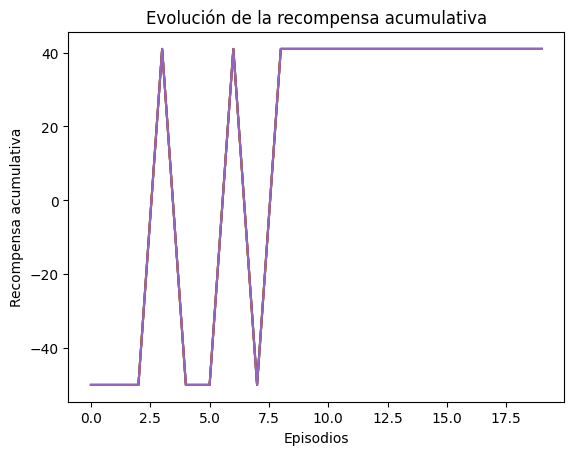

In [53]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

### A2C

In [54]:
eval_callback_a2c = EvalCallback(env, best_model_save_path='./pruebas/a2c/',
                             log_path='./pruebas/a2c/', eval_freq=1000,
                             deterministic=True, render=False)

In [55]:
modelA2C = A2C("MlpPolicy", env, verbose=1)
modelA2C.learn(total_timesteps, callback=eval_callback_a2c)

Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 1387     |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | 0.147    |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | -8.29    |
|    value_loss         | 64.2     |
------------------------------------
Eval num_timesteps=1000, episode_reward=-50.00 +/- 0.00
Episode length: 50.00 +/- 0.00
------------------------------------
| eval/                 |          |
|    mean_ep_length     | 50       |
|    mean_reward        | -50      |
| time/                 |          |
|    total_timesteps    | 1000     |
| train/                |          |
|    entropy_loss       | -1.37    |
|    explained_variance | 0.0607   |
|    learning_rate      | 0.0007   |
|    n_u

In [56]:
evaluations = np.load('./pruebas/a2c/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [-50. -50. -50. -50. -50.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]
 [ 41.  41.  41.  41.  41.]]
Longitud de episodios: [[50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10 10 10]]


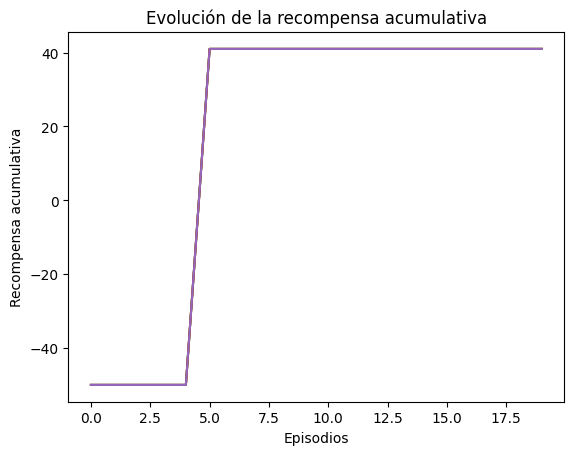

In [57]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

#### Optimización de hiperparametros

In [58]:
def train_agent_with_hyperparameters(trial):
    # Definir los hiperparámetros a optimizar
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True)
    n_steps = trial.suggest_int("n_steps", 16, 2048, log=True)
    ent_coef = trial.suggest_float("ent_coef", 0.0, 0.01)
    policy_kwargs = {
        "net_arch": [trial.suggest_int("n_hidden", 32, 512)]
    }

    env = DummyVecEnv([lambda: MiLaberinto()])

    model = A2C("MlpPolicy", env, verbose=3, learning_rate=learning_rate, n_steps=n_steps, ent_coef=ent_coef, policy_kwargs=policy_kwargs)

    model.learn(total_timesteps=20000)

    mean_reward, _ = evaluate_policy(model, env, n_eval_episodes=10)

    return mean_reward

if __name__ == "__main__":
    study = optuna.create_study(direction="maximize")
    study.optimize(train_agent_with_hyperparameters, n_trials=50)

    print("Best trial:")
    best_trial = study.best_trial
    print("  Value: {}".format(best_trial.value))
    print("  Params: ")
    for key, value in best_trial.params.items():
        print("    {}: {}".format(key, value))

[I 2023-10-31 00:09:26,871] A new study created in memory with name: no-name-d4a9a6ab-3940-4574-bc7d-12da533171a5


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3661     |
|    iterations         | 100      |
|    time_elapsed       | 4        |
|    total_timesteps    | 16000    |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.00802  |
|    learning_rate      | 0.000215 |
|    n_updates          | 99       |
|    policy_loss        | -68.9    |
|    value_loss         | 3.37e+03 |
------------------------------------


[I 2023-10-31 00:09:32,346] Trial 0 finished with value: 41.0 and parameters: {'learning_rate': 0.00021496184592797668, 'n_steps': 160, 'ent_coef': 0.0033031781044393516, 'n_hidden': 272}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3352     |
|    iterations         | 100      |
|    time_elapsed       | 4        |
|    total_timesteps    | 15800    |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.0007   |
|    learning_rate      | 1.47e-05 |
|    n_updates          | 99       |
|    policy_loss        | -63      |
|    value_loss         | 3.1e+03  |
------------------------------------


[I 2023-10-31 00:09:38,419] Trial 1 finished with value: -50.0 and parameters: {'learning_rate': 1.4742421377538563e-05, 'n_steps': 158, 'ent_coef': 0.0044472229679955, 'n_hidden': 487}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 2183     |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 2000     |
| train/                |          |
|    entropy_loss       | -0.201   |
|    explained_variance | 0.957    |
|    learning_rate      | 0.00774  |
|    n_updates          | 99       |
|    policy_loss        | -1.08    |
|    value_loss         | 9.67     |
------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 2509      |
|    iterations         | 200       |
|    time_elapsed       | 1         |
|    total_timesteps    | 4000      |
| train/                |           |
|    entropy_loss       | -0.00333  |
|    explained_variance | -4.21     |
|    learning_rate      | 0.00774   |
|    n_updates          | 199       |
|    policy_loss        | -0.000107 |
|    valu

[I 2023-10-31 00:09:45,587] Trial 2 finished with value: -59.0 and parameters: {'learning_rate': 0.0077420173617521815, 'n_steps': 20, 'ent_coef': 0.005752963470537172, 'n_hidden': 257}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:09:51,471] Trial 3 finished with value: -50.0 and parameters: {'learning_rate': 0.0032462395524339464, 'n_steps': 1610, 'ent_coef': 0.005467045266700075, 'n_hidden': 78}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 2957     |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 2600     |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.0021   |
|    learning_rate      | 9.21e-05 |
|    n_updates          | 99       |
|    policy_loss        | -24.6    |
|    value_loss         | 562      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 2975     |
|    iterations         | 200      |
|    time_elapsed       | 1        |
|    total_timesteps    | 5200     |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | -0.00475 |
|    learning_rate      | 9.21e-05 |
|    n_updates          | 199      |
|    policy_loss        | -21      |
|    value_loss      

[I 2023-10-31 00:09:59,261] Trial 4 finished with value: -50.0 and parameters: {'learning_rate': 9.206254521529969e-05, 'n_steps': 26, 'ent_coef': 0.009936224603679081, 'n_hidden': 279}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3013     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 6200     |
| train/                |          |
|    entropy_loss       | -0.00923 |
|    explained_variance | 0.244    |
|    learning_rate      | 0.00661  |
|    n_updates          | 99       |
|    policy_loss        | 0.00796  |
|    value_loss         | 123      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3140     |
|    iterations         | 200      |
|    time_elapsed       | 3        |
|    total_timesteps    | 12400    |
| train/                |          |
|    entropy_loss       | -0.526   |
|    explained_variance | 0.392    |
|    learning_rate      | 0.00661  |
|    n_updates          | 199      |
|    policy_loss        | 21.5     |
|    value_loss      

[I 2023-10-31 00:10:05,921] Trial 5 finished with value: 41.0 and parameters: {'learning_rate': 0.0066128495273416205, 'n_steps': 62, 'ent_coef': 0.006179042041557797, 'n_hidden': 419}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:10:11,265] Trial 6 finished with value: 41.0 and parameters: {'learning_rate': 0.0019212209693344438, 'n_steps': 876, 'ent_coef': 0.0005134809679898977, 'n_hidden': 326}. Best is trial 0 with value: 41.0.


Using cpu device
-------------------------------------
| time/                 |           |
|    fps                | 3188      |
|    iterations         | 100       |
|    time_elapsed       | 4         |
|    total_timesteps    | 15500     |
| train/                |           |
|    entropy_loss       | -0.000697 |
|    explained_variance | 1.19e-07  |
|    learning_rate      | 0.00853   |
|    n_updates          | 99        |
|    policy_loss        | 2.08e-05  |
|    value_loss         | 149       |
-------------------------------------


[I 2023-10-31 00:10:17,573] Trial 7 finished with value: -50.0 and parameters: {'learning_rate': 0.00853060820402113, 'n_steps': 155, 'ent_coef': 0.004763049052088139, 'n_hidden': 502}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:10:23,302] Trial 8 finished with value: -50.0 and parameters: {'learning_rate': 0.000504639274614561, 'n_steps': 1060, 'ent_coef': 0.0019992316983584845, 'n_hidden': 492}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:10:29,223] Trial 9 finished with value: 41.0 and parameters: {'learning_rate': 0.0018902943739675013, 'n_steps': 706, 'ent_coef': 0.0035513318205360545, 'n_hidden': 352}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:10:34,722] Trial 10 finished with value: -50.0 and parameters: {'learning_rate': 0.00017086633187806573, 'n_steps': 353, 'ent_coef': 0.000379063540921383, 'n_hidden': 156}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 2810     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 6100     |
| train/                |          |
|    entropy_loss       | -1.35    |
|    explained_variance | 0.0742   |
|    learning_rate      | 0.000542 |
|    n_updates          | 99       |
|    policy_loss        | -58.3    |
|    value_loss         | 2.24e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 2720     |
|    iterations         | 200      |
|    time_elapsed       | 4        |
|    total_timesteps    | 12200    |
| train/                |          |
|    entropy_loss       | -1.04    |
|    explained_variance | 0.129    |
|    learning_rate      | 0.000542 |
|    n_updates          | 199      |
|    policy_loss        | 28.3     |
|    value_loss      

[I 2023-10-31 00:10:41,815] Trial 11 finished with value: 41.0 and parameters: {'learning_rate': 0.0005421092150811742, 'n_steps': 61, 'ent_coef': 0.007014471601214158, 'n_hidden': 398}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3451     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 8100     |
| train/                |          |
|    entropy_loss       | -1.33    |
|    explained_variance | 0.0559   |
|    learning_rate      | 0.000607 |
|    n_updates          | 99       |
|    policy_loss        | 19.4     |
|    value_loss         | 631      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3280     |
|    iterations         | 200      |
|    time_elapsed       | 4        |
|    total_timesteps    | 16200    |
| train/                |          |
|    entropy_loss       | -1.06    |
|    explained_variance | 0.18     |
|    learning_rate      | 0.000607 |
|    n_updates          | 199      |
|    policy_loss        | 32       |
|    value_loss      

[I 2023-10-31 00:10:47,957] Trial 12 finished with value: -50.0 and parameters: {'learning_rate': 0.0006067285781732581, 'n_steps': 81, 'ent_coef': 0.0025921097101413455, 'n_hidden': 162}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3210     |
|    iterations         | 100      |
|    time_elapsed       | 1        |
|    total_timesteps    | 5700     |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.00404  |
|    learning_rate      | 8.28e-05 |
|    n_updates          | 99       |
|    policy_loss        | -64.7    |
|    value_loss         | 2.89e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3058     |
|    iterations         | 200      |
|    time_elapsed       | 3        |
|    total_timesteps    | 11400    |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.00508  |
|    learning_rate      | 8.28e-05 |
|    n_updates          | 199      |
|    policy_loss        | -21.5    |
|    value_loss      

[I 2023-10-31 00:10:54,690] Trial 13 finished with value: -50.0 and parameters: {'learning_rate': 8.27651749058761e-05, 'n_steps': 57, 'ent_coef': 0.007001793128825682, 'n_hidden': 210}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3466     |
|    iterations         | 100      |
|    time_elapsed       | 5        |
|    total_timesteps    | 20100    |
| train/                |          |
|    entropy_loss       | -0.802   |
|    explained_variance | 0.304    |
|    learning_rate      | 0.00103  |
|    n_updates          | 99       |
|    policy_loss        | 11.9     |
|    value_loss         | 399      |
------------------------------------


[I 2023-10-31 00:11:00,548] Trial 14 finished with value: 41.0 and parameters: {'learning_rate': 0.0010320330484514305, 'n_steps': 201, 'ent_coef': 0.0033300441015896194, 'n_hidden': 407}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:11:06,340] Trial 15 finished with value: 41.0 and parameters: {'learning_rate': 0.0002441270487937297, 'n_steps': 371, 'ent_coef': 0.0019054022765300728, 'n_hidden': 425}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3164     |
|    iterations         | 100      |
|    time_elapsed       | 1        |
|    total_timesteps    | 3700     |
| train/                |          |
|    entropy_loss       | -0.0331  |
|    explained_variance | 0.046    |
|    learning_rate      | 0.00413  |
|    n_updates          | 99       |
|    policy_loss        | -0.00237 |
|    value_loss         | 154      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3124     |
|    iterations         | 200      |
|    time_elapsed       | 2        |
|    total_timesteps    | 7400     |
| train/                |          |
|    entropy_loss       | -0.00836 |
|    explained_variance | 0.0373   |
|    learning_rate      | 0.00413  |
|    n_updates          | 199      |
|    policy_loss        | 0.00134  |
|    value_loss      

[I 2023-10-31 00:11:13,265] Trial 16 finished with value: -50.0 and parameters: {'learning_rate': 0.004133967196120501, 'n_steps': 37, 'ent_coef': 0.0065847296153415825, 'n_hidden': 314}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3003     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 8900     |
| train/                |          |
|    entropy_loss       | -0.894   |
|    explained_variance | 0.382    |
|    learning_rate      | 0.00137  |
|    n_updates          | 99       |
|    policy_loss        | 13.9     |
|    value_loss         | 451      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3132     |
|    iterations         | 200      |
|    time_elapsed       | 5        |
|    total_timesteps    | 17800    |
| train/                |          |
|    entropy_loss       | -0.297   |
|    explained_variance | 0.945    |
|    learning_rate      | 0.00137  |
|    n_updates          | 199      |
|    policy_loss        | -0.295   |
|    value_loss      

[I 2023-10-31 00:11:19,607] Trial 17 finished with value: 41.0 and parameters: {'learning_rate': 0.001365862819432347, 'n_steps': 89, 'ent_coef': 0.007916950795678985, 'n_hidden': 224}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 2900     |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 1600     |
| train/                |          |
|    entropy_loss       | -0.389   |
|    explained_variance | 0.754    |
|    learning_rate      | 0.00976  |
|    n_updates          | 99       |
|    policy_loss        | -1.66    |
|    value_loss         | 12.8     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 2890     |
|    iterations         | 200      |
|    time_elapsed       | 1        |
|    total_timesteps    | 3200     |
| train/                |          |
|    entropy_loss       | -0.02    |
|    explained_variance | 0.998    |
|    learning_rate      | 0.00976  |
|    n_updates          | 199      |
|    policy_loss        | 0.00086  |
|    value_loss      

[I 2023-10-31 00:11:27,090] Trial 18 finished with value: 41.0 and parameters: {'learning_rate': 0.009756344396406026, 'n_steps': 16, 'ent_coef': 0.004006807200453061, 'n_hidden': 40}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3204     |
|    iterations         | 100      |
|    time_elapsed       | 1        |
|    total_timesteps    | 3500     |
| train/                |          |
|    entropy_loss       | -0.136   |
|    explained_variance | 0.989    |
|    learning_rate      | 0.00429  |
|    n_updates          | 99       |
|    policy_loss        | 0.0748   |
|    value_loss         | 0.66     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3173     |
|    iterations         | 200      |
|    time_elapsed       | 2        |
|    total_timesteps    | 7000     |
| train/                |          |
|    entropy_loss       | -0.0322  |
|    explained_variance | 0.994    |
|    learning_rate      | 0.00429  |
|    n_updates          | 199      |
|    policy_loss        | 0.00432  |
|    value_loss      

[I 2023-10-31 00:11:35,128] Trial 19 finished with value: 41.0 and parameters: {'learning_rate': 0.004289894866382797, 'n_steps': 35, 'ent_coef': 0.004804267060514174, 'n_hidden': 366}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3315     |
|    iterations         | 100      |
|    time_elapsed       | 3        |
|    total_timesteps    | 10600    |
| train/                |          |
|    entropy_loss       | -1.14    |
|    explained_variance | 0.0932   |
|    learning_rate      | 0.00102  |
|    n_updates          | 99       |
|    policy_loss        | 31.3     |
|    value_loss         | 1.27e+03 |
------------------------------------


[I 2023-10-31 00:11:41,420] Trial 20 finished with value: -50.0 and parameters: {'learning_rate': 0.0010189622382300323, 'n_steps': 106, 'ent_coef': 0.005700314893500965, 'n_hidden': 153}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:11:46,924] Trial 21 finished with value: 41.0 and parameters: {'learning_rate': 0.002689474553893125, 'n_steps': 290, 'ent_coef': 0.0003787191803793779, 'n_hidden': 333}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:11:52,387] Trial 22 finished with value: 41.0 and parameters: {'learning_rate': 0.0025913598559801944, 'n_steps': 560, 'ent_coef': 0.0013163556833451, 'n_hidden': 295}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:11:58,013] Trial 23 finished with value: 41.0 and parameters: {'learning_rate': 0.0043361543822317845, 'n_steps': 219, 'ent_coef': 0.002800798068773262, 'n_hidden': 427}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3436     |
|    iterations         | 100      |
|    time_elapsed       | 4        |
|    total_timesteps    | 13900    |
| train/                |          |
|    entropy_loss       | -0.113   |
|    explained_variance | 0.997    |
|    learning_rate      | 0.00169  |
|    n_updates          | 99       |
|    policy_loss        | -0.045   |
|    value_loss         | 0.297    |
------------------------------------


[I 2023-10-31 00:12:04,030] Trial 24 finished with value: 41.0 and parameters: {'learning_rate': 0.0016907851158437907, 'n_steps': 139, 'ent_coef': 0.0008591989378621953, 'n_hidden': 448}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:12:09,567] Trial 25 finished with value: 41.0 and parameters: {'learning_rate': 0.0054461358335870964, 'n_steps': 527, 'ent_coef': 0.0013940284411912906, 'n_hidden': 373}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:12:15,094] Trial 26 finished with value: -50.0 and parameters: {'learning_rate': 0.0020819827848821697, 'n_steps': 2040, 'ent_coef': 0.002894997393335849, 'n_hidden': 247}. Best is trial 0 with value: 41.0.


Using cpu device
-------------------------------------
| time/                 |           |
|    fps                | 2878      |
|    iterations         | 100       |
|    time_elapsed       | 4         |
|    total_timesteps    | 11900     |
| train/                |           |
|    entropy_loss       | -0.000662 |
|    explained_variance | 0.203     |
|    learning_rate      | 0.00668   |
|    n_updates          | 99        |
|    policy_loss        | -0.000135 |
|    value_loss         | 98.1      |
-------------------------------------


[I 2023-10-31 00:12:21,777] Trial 27 finished with value: -50.0 and parameters: {'learning_rate': 0.006676822160136081, 'n_steps': 119, 'ent_coef': 7.648109109503114e-05, 'n_hidden': 316}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:12:27,832] Trial 28 finished with value: 41.0 and parameters: {'learning_rate': 0.0010138575862456442, 'n_steps': 249, 'ent_coef': 0.003979174650186807, 'n_hidden': 452}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3462     |
|    iterations         | 100      |
|    time_elapsed       | 5        |
|    total_timesteps    | 19800    |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.000495 |
|    learning_rate      | 1.45e-05 |
|    n_updates          | 99       |
|    policy_loss        | -67.8    |
|    value_loss         | 3.33e+03 |
------------------------------------


[I 2023-10-31 00:12:33,766] Trial 29 finished with value: -50.0 and parameters: {'learning_rate': 1.445405909489121e-05, 'n_steps': 198, 'ent_coef': 0.0020406264191764546, 'n_hidden': 389}. Best is trial 0 with value: 41.0.


Using cpu device
-------------------------------------
| time/                 |           |
|    fps                | 3737      |
|    iterations         | 100       |
|    time_elapsed       | 4         |
|    total_timesteps    | 15700     |
| train/                |           |
|    entropy_loss       | -0.074    |
|    explained_variance | 1         |
|    learning_rate      | 0.00322   |
|    n_updates          | 99        |
|    policy_loss        | -0.000765 |
|    value_loss         | 0.0095    |
-------------------------------------


[I 2023-10-31 00:12:39,182] Trial 30 finished with value: 41.0 and parameters: {'learning_rate': 0.003224683029248216, 'n_steps': 157, 'ent_coef': 0.004264463846879663, 'n_hidden': 193}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:12:44,807] Trial 31 finished with value: -50.0 and parameters: {'learning_rate': 0.0019356788719706217, 'n_steps': 780, 'ent_coef': 0.0033408715110188033, 'n_hidden': 342}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:12:50,287] Trial 32 finished with value: 41.0 and parameters: {'learning_rate': 0.007273399928229329, 'n_steps': 746, 'ent_coef': 0.003347363812544934, 'n_hidden': 293}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:12:56,705] Trial 33 finished with value: 41.0 and parameters: {'learning_rate': 0.005313410991170141, 'n_steps': 1196, 'ent_coef': 0.005330738369546635, 'n_hidden': 353}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:13:02,996] Trial 34 finished with value: 41.0 and parameters: {'learning_rate': 0.0026148648398213663, 'n_steps': 352, 'ent_coef': 0.004465272990576756, 'n_hidden': 249}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:13:08,481] Trial 35 finished with value: -50.0 and parameters: {'learning_rate': 0.00890394487328501, 'n_steps': 473, 'ent_coef': 0.0050667939249742595, 'n_hidden': 453}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:13:13,761] Trial 36 finished with value: -50.0 and parameters: {'learning_rate': 0.0036964448655912446, 'n_steps': 1445, 'ent_coef': 0.0038646260192200647, 'n_hidden': 267}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:13:19,364] Trial 37 finished with value: 41.0 and parameters: {'learning_rate': 0.00618566525396543, 'n_steps': 817, 'ent_coef': 0.0007662715742370923, 'n_hidden': 331}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3094     |
|    iterations         | 100      |
|    time_elapsed       | 5        |
|    total_timesteps    | 17300    |
| train/                |          |
|    entropy_loss       | -1.34    |
|    explained_variance | 0.0852   |
|    learning_rate      | 0.000315 |
|    n_updates          | 99       |
|    policy_loss        | 32.9     |
|    value_loss         | 1.04e+03 |
------------------------------------


[I 2023-10-31 00:13:25,876] Trial 38 finished with value: -50.0 and parameters: {'learning_rate': 0.00031528717219122046, 'n_steps': 173, 'ent_coef': 0.006082798518186444, 'n_hidden': 474}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:13:31,662] Trial 39 finished with value: -50.0 and parameters: {'learning_rate': 0.00012377917747633362, 'n_steps': 294, 'ent_coef': 0.004617086075090087, 'n_hidden': 382}. Best is trial 0 with value: 41.0.


Using cpu device


[I 2023-10-31 00:13:37,728] Trial 40 finished with value: -50.0 and parameters: {'learning_rate': 0.0007408971071295551, 'n_steps': 1189, 'ent_coef': 0.002163995083916953, 'n_hidden': 282}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3246     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 6800     |
| train/                |          |
|    entropy_loss       | -1.24    |
|    explained_variance | 0.106    |
|    learning_rate      | 0.000463 |
|    n_updates          | 99       |
|    policy_loss        | 28       |
|    value_loss         | 879      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3199     |
|    iterations         | 200      |
|    time_elapsed       | 4        |
|    total_timesteps    | 13600    |
| train/                |          |
|    entropy_loss       | -0.981   |
|    explained_variance | 0.175    |
|    learning_rate      | 0.000463 |
|    n_updates          | 199      |
|    policy_loss        | 24.1     |
|    value_loss      

[I 2023-10-31 00:13:44,243] Trial 41 finished with value: -50.0 and parameters: {'learning_rate': 0.00046304924249167213, 'n_steps': 68, 'ent_coef': 0.007396298310568691, 'n_hidden': 403}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 2884     |
|    iterations         | 100      |
|    time_elapsed       | 1        |
|    total_timesteps    | 5000     |
| train/                |          |
|    entropy_loss       | -0.768   |
|    explained_variance | 0.362    |
|    learning_rate      | 0.0014   |
|    n_updates          | 99       |
|    policy_loss        | 15.3     |
|    value_loss         | 519      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 2810     |
|    iterations         | 200      |
|    time_elapsed       | 3        |
|    total_timesteps    | 10000    |
| train/                |          |
|    entropy_loss       | -0.159   |
|    explained_variance | 0.991    |
|    learning_rate      | 0.0014   |
|    n_updates          | 199      |
|    policy_loss        | 0.0665   |
|    value_loss      

[I 2023-10-31 00:13:51,047] Trial 42 finished with value: 41.0 and parameters: {'learning_rate': 0.0013996901506369696, 'n_steps': 50, 'ent_coef': 0.005214588331046025, 'n_hidden': 359}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3357     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 9200     |
| train/                |          |
|    entropy_loss       | -1.31    |
|    explained_variance | 0.122    |
|    learning_rate      | 0.000424 |
|    n_updates          | 99       |
|    policy_loss        | 32       |
|    value_loss         | 957      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3354     |
|    iterations         | 200      |
|    time_elapsed       | 5        |
|    total_timesteps    | 18400    |
| train/                |          |
|    entropy_loss       | -1.06    |
|    explained_variance | 0.193    |
|    learning_rate      | 0.000424 |
|    n_updates          | 199      |
|    policy_loss        | 37.4     |
|    value_loss      

[I 2023-10-31 00:13:57,122] Trial 43 finished with value: -50.0 and parameters: {'learning_rate': 0.0004236516678070372, 'n_steps': 92, 'ent_coef': 0.006094794446737731, 'n_hidden': 420}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3177     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 7000     |
| train/                |          |
|    entropy_loss       | -1.05    |
|    explained_variance | 0.106    |
|    learning_rate      | 0.000716 |
|    n_updates          | 99       |
|    policy_loss        | 26.3     |
|    value_loss         | 1.01e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3310     |
|    iterations         | 200      |
|    time_elapsed       | 4        |
|    total_timesteps    | 14000    |
| train/                |          |
|    entropy_loss       | -0.873   |
|    explained_variance | 0.233    |
|    learning_rate      | 0.000716 |
|    n_updates          | 199      |
|    policy_loss        | 17.8     |
|    value_loss      

[I 2023-10-31 00:14:03,432] Trial 44 finished with value: -50.0 and parameters: {'learning_rate': 0.0007162660091674905, 'n_steps': 70, 'ent_coef': 0.0024523083879911456, 'n_hidden': 313}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3491     |
|    iterations         | 100      |
|    time_elapsed       | 3        |
|    total_timesteps    | 13200    |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | 0.0134   |
|    learning_rate      | 0.000203 |
|    n_updates          | 99       |
|    policy_loss        | -54.3    |
|    value_loss         | 2.26e+03 |
------------------------------------


[I 2023-10-31 00:14:09,374] Trial 45 finished with value: -50.0 and parameters: {'learning_rate': 0.00020275651341537083, 'n_steps': 132, 'ent_coef': 0.0016840772768177696, 'n_hidden': 402}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3303     |
|    iterations         | 100      |
|    time_elapsed       | 3        |
|    total_timesteps    | 10900    |
| train/                |          |
|    entropy_loss       | -1.37    |
|    explained_variance | 0.003    |
|    learning_rate      | 0.000339 |
|    n_updates          | 99       |
|    policy_loss        | 2.81     |
|    value_loss         | 788      |
------------------------------------


[I 2023-10-31 00:14:15,561] Trial 46 finished with value: -50.0 and parameters: {'learning_rate': 0.000338748931585824, 'n_steps': 109, 'ent_coef': 0.0035274646516519287, 'n_hidden': 499}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3285     |
|    iterations         | 100      |
|    time_elapsed       | 1        |
|    total_timesteps    | 4700     |
| train/                |          |
|    entropy_loss       | -1.1     |
|    explained_variance | 0.124    |
|    learning_rate      | 0.000645 |
|    n_updates          | 99       |
|    policy_loss        | 34.1     |
|    value_loss         | 1.13e+03 |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3123     |
|    iterations         | 200      |
|    time_elapsed       | 3        |
|    total_timesteps    | 9400     |
| train/                |          |
|    entropy_loss       | -0.92    |
|    explained_variance | 0.354    |
|    learning_rate      | 0.000645 |
|    n_updates          | 199      |
|    policy_loss        | 23.1     |
|    value_loss      

[I 2023-10-31 00:14:22,150] Trial 47 finished with value: 41.0 and parameters: {'learning_rate': 0.0006448059805040079, 'n_steps': 47, 'ent_coef': 0.0028397458151460707, 'n_hidden': 381}. Best is trial 0 with value: 41.0.


Using cpu device
-------------------------------------
| time/                 |           |
|    fps                | 3268      |
|    iterations         | 100       |
|    time_elapsed       | 0         |
|    total_timesteps    | 3000      |
| train/                |           |
|    entropy_loss       | -1.39     |
|    explained_variance | -0.000239 |
|    learning_rate      | 5.66e-05  |
|    n_updates          | 99        |
|    policy_loss        | -22.6     |
|    value_loss         | 403       |
-------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3277     |
|    iterations         | 200      |
|    time_elapsed       | 1        |
|    total_timesteps    | 6000     |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.00105  |
|    learning_rate      | 5.66e-05 |
|    n_updates          | 199      |
|    policy_loss        | 4.66     |
|    va

[I 2023-10-31 00:14:28,998] Trial 48 finished with value: -50.0 and parameters: {'learning_rate': 5.6617767012487646e-05, 'n_steps': 30, 'ent_coef': 0.00790254758847112, 'n_hidden': 227}. Best is trial 0 with value: 41.0.


Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 3244     |
|    iterations         | 100      |
|    time_elapsed       | 2        |
|    total_timesteps    | 8200     |
| train/                |          |
|    entropy_loss       | -0.877   |
|    explained_variance | 0.293    |
|    learning_rate      | 0.0014   |
|    n_updates          | 99       |
|    policy_loss        | 23.7     |
|    value_loss         | 996      |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 3263     |
|    iterations         | 200      |
|    time_elapsed       | 5        |
|    total_timesteps    | 16400    |
| train/                |          |
|    entropy_loss       | -0.627   |
|    explained_variance | 0.505    |
|    learning_rate      | 0.0014   |
|    n_updates          | 199      |
|    policy_loss        | 0.925    |
|    value_loss      

[I 2023-10-31 00:14:35,057] Trial 49 finished with value: 41.0 and parameters: {'learning_rate': 0.0014023779594475034, 'n_steps': 82, 'ent_coef': 0.006561049920578909, 'n_hidden': 307}. Best is trial 0 with value: 41.0.


Best trial:
  Value: 41.0
  Params: 
    learning_rate: 0.00021496184592797668
    n_steps: 160
    ent_coef: 0.0033031781044393516
    n_hidden: 272


In [59]:
best_learning_rate = 0.00021496184592797668
best_n_steps = 160
best_ent_coef = 0.0033031781044393516
best_n_hidden = 272

In [60]:
eval_callback_a2c = EvalCallback(env, best_model_save_path='./pruebas/a2c/optimizado',
                             log_path='./pruebas/a2c/optimizado', eval_freq=1000,
                             deterministic=True, render=False)

In [77]:
modelA2C = A2C("MlpPolicy", env, verbose=5,  learning_rate=best_learning_rate, n_steps=best_n_steps, ent_coef=best_ent_coef, policy_kwargs={"net_arch": [best_n_hidden]})
modelA2C.learn(total_timesteps, callback=eval_callback_a2c)

Using cpu device
Eval num_timesteps=324, episode_reward=-50.00 +/- 0.00
Episode length: 50.00 +/- 0.00
------------------------------------
| eval/                 |          |
|    mean_ep_length     | 50       |
|    mean_reward        | -50      |
| time/                 |          |
|    total_timesteps    | 324      |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.000804 |
|    learning_rate      | 0.000215 |
|    n_updates          | 2        |
|    policy_loss        | -75.9    |
|    value_loss         | 4.24e+03 |
------------------------------------
Eval num_timesteps=1324, episode_reward=-59.00 +/- 0.00
Episode length: 50.00 +/- 0.00
------------------------------------
| eval/                 |          |
|    mean_ep_length     | 50       |
|    mean_reward        | -59      |
| time/                 |          |
|    total_timesteps    | 1324     |
| train/                |          |
|    entropy_loss       | -1.39  

In [78]:
evaluations = np.load('./pruebas/a2c/optimizado/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[  41.   41.   41.   41.   41.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -50.  -50.  -50.]
 [ -50.  -50.  -5

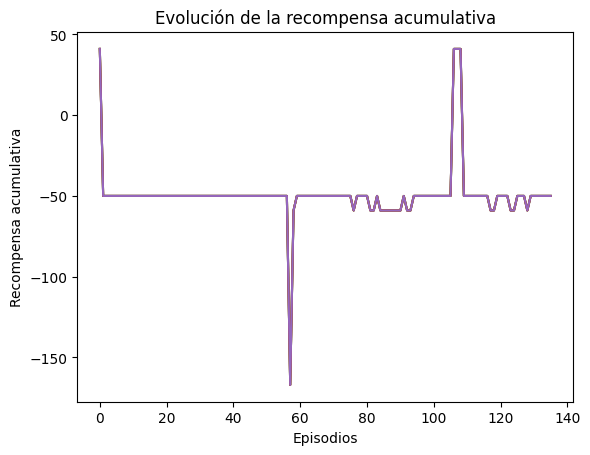

In [79]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

## Pruebas con otras funciones de recompensa

La primer prueba va a ser otorgar una recompensa basada en la distancia al objetivo cuando el agente no haya caído en un pozo ni llegado al objetivo. La penalización por moverse sigue siendo -1, y la recompensa basada en la distancia se resta de esta penalización. A medida que el agente se acerque al objetivo, la recompensa será menos negativa, y cuando llegue al objetivo, la recompensa será 50.



In [32]:
class MiLaberinto2(gym.Env):
    def __init__(self):
        super(MiLaberinto2, self).__init__()
        
        self.shape = (6, 6)  # Tamaño del laberinto (6x6)

        self.observation_space = spaces.Discrete(self.shape[0] * self.shape[1])
        self.action_space = spaces.Discrete(4)  # Movimientos 0: Arriba, 1: Derecha, 2: Abajo, 3: Izquierda

        self.agent_position = (0, 0) #Posición Inicial
        self.target_position = (self.shape[0] - 1, self.shape[1] - 1) #Posición target

        self.pit_positions = [(1, 1), (2, 3), (3, 0), (4, 2), (5, 4)] #Pozos

        self.max_steps = 50 #Número máximo de pasos

        self.current_step = 0 #Contador de pasos

    def reset(self, seed = None):
        self.agent_position = (0, 0)
        self.current_step = 0

        obs = self._get_observation()
        info = {}

        return obs, info
    
    def _get_observation(self):
        # Convertir la posición del agente en una observación discreta
        return self.agent_position[0] * self.shape[1] + self.agent_position[1]

    def step(self, action):
        self.current_step += 1  # Suma un paso

        self._take_action(action)  # Toma Acción

        reward = self._calculate_reward()  # Calcula recompensa

        done = self._is_episode_done()  # Comprueba si el episodio terminó

        obs = self._get_observation()
        info = {}

        return obs, reward, done, False, info


    def _take_action(self, action):
        movements = [(0, 1), (1, 0), (0, -1), (-1, 0)] #Defino movimientos

        # Calculo la nueva posición del agente
        new_position = (
            self.agent_position[0] + movements[action][0],
            self.agent_position[1] + movements[action][1]
        )

        # Verifico si la nueva posición está dentro de los límites del laberinto
        if (0 <= new_position[0] < self.shape[0]) and (0 <= new_position[1] < self.shape[1]):

            self.agent_position = new_position #Actualizo la posición del agente

    def _calculate_reward(self):
        if self.agent_position in self.pit_positions:
            return -10  # Penalización por caer en un pozo
        elif self.agent_position == self.target_position:
            return 50  # Recompensa por llegar al objetivo
        else:
            # Calcular la distancia al objetivo
            distance = abs(self.agent_position[0] - self.target_position[0]) + abs(self.agent_position[1] - self.target_position[1])
            # Calcular la recompensa basada en la distancia
            return -1 - 0.1 * distance

    def _is_episode_done(self):
        # Comprobar si se ha superado el límite de pasos o si el agente llegó al objetivo
        return (
            self.current_step >= self.max_steps
            or self.agent_position == self.target_position
        )

    def render(self, mode="human"):
        if mode == "human":
            # Crear una representación visual del laberinto
            for i in range(self.shape[0]):
                for j in range(self.shape[1]):
                    if (i, j) == self.agent_position:
                        print("A", end=" ")  # Agente
                    elif (i, j) in self.pit_positions:
                        print("P", end=" ")  # Pozo
                    elif (i, j) == self.target_position:
                        print("T", end=" ")  # Objetivo
                    else:
                        print(".", end=" ")  # Espacio vacío
                print() 
            print()
        elif mode == "tensorboard":
            # Crea una matriz que represente el laberinto
            maze = np.full(self.shape, ".", dtype=np.str)

            # Establece la posición del agente en el laberinto
            agent_row, agent_col = self.agent_position
            maze[agent_row, agent_col] = "A"

            # Coloca los pozos en el laberinto
            for pit in self.pit_positions:
                maze[pit[0], pit[1]] = "P"

            # Coloca el objetivo en el laberinto
            maze[self.target_position[0], self.target_position[1]] = "T"

            return maze  # Devuelve la representación del laberinto
            
    def close(self):
        pass

In [33]:
env = DummyVecEnv([lambda: MiLaberinto2()])

Como algoritmo vamos a utilizar A2C que es el que mejor performó

In [34]:
eval_callback_a2c = EvalCallback(env, best_model_save_path='./pruebas/a2c/recompensa2/',
                             log_path='./pruebas/a2c/recompensa2/', eval_freq=1000,
                             deterministic=True, render=False)

In [35]:
modelA2C = A2C("MlpPolicy", env, verbose=1)
modelA2C.learn(total_timesteps, callback=eval_callback_a2c)

Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 2067     |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | 0.117    |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | -6.95    |
|    value_loss         | 30.4     |
------------------------------------
Eval num_timesteps=1000, episode_reward=-100.00 +/- 0.00
Episode length: 50.00 +/- 0.00
------------------------------------
| eval/                 |          |
|    mean_ep_length     | 50       |
|    mean_reward        | -100     |
| time/                 |          |
|    total_timesteps    | 1000     |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | -0.0211  |
|    learning_rate      | 0.0007   |
|    n_

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/common/evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


------------------------------------
| time/                 |          |
|    fps                | 2452     |
|    iterations         | 300      |
|    time_elapsed       | 0        |
|    total_timesteps    | 1500     |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | 0.0157   |
|    learning_rate      | 0.0007   |
|    n_updates          | 299      |
|    policy_loss        | -6.24    |
|    value_loss         | 23.9     |
------------------------------------
Eval num_timesteps=2000, episode_reward=-100.00 +/- 0.00
Episode length: 50.00 +/- 0.00
------------------------------------
| eval/                 |          |
|    mean_ep_length     | 50       |
|    mean_reward        | -100     |
| time/                 |          |
|    total_timesteps    | 2000     |
| train/                |          |
|    entropy_loss       | -1.37    |
|    explained_variance | -0.00895 |
|    learning_rate      | 0.0007   |
|    n_updates          

In [36]:
evaluations = np.load('./pruebas/a2c/recompensa2/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[-100.  -100.  -100.  -100.  -100. ]
 [-100.  -100.  -100.  -100.  -100. ]
 [-100.  -100.  -100.  -100.  -100. ]
 [-100.  -100.  -100.  -100.  -100. ]
 [-100.  -100.  -100.  -100.  -100. ]
 [-100.  -100.  -100.  -100.  -100. ]
 [-100.  -100.  -100.  -100.  -100. ]
 [-100.  -100.  -100.  -100.  -100. ]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]
 [  36.5   36.5   36.5   36.5   36.5]]
Longitud de episodios: [[50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [50 50 50 50 50]
 [10 10 10 10 10]
 [10 10 10 10 10]
 [10 10 10

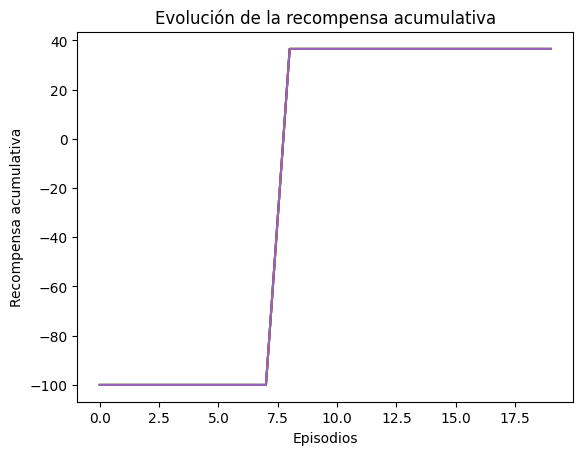

In [37]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

En esta segunda prueba el objetivo va a ser agregar una penalización adicional a la definida por paso donde se reste 0.01 por cada paso adicional que el agente toma. Esto significa que el agente recibirá una recompensa negativa que aumenta linealmente a medida que pasa más tiempo en el entorno.

In [38]:
class MiLaberinto3(gym.Env):
    def __init__(self):
        super(MiLaberinto3, self).__init__()
        
        self.shape = (6, 6)  # Tamaño del laberinto (6x6)

        self.observation_space = spaces.Discrete(self.shape[0] * self.shape[1])
        self.action_space = spaces.Discrete(4)  # Movimientos 0: Arriba, 1: Derecha, 2: Abajo, 3: Izquierda

        self.agent_position = (0, 0) #Posición Inicial
        self.target_position = (self.shape[0] - 1, self.shape[1] - 1) #Posición target

        self.pit_positions = [(1, 1), (2, 3), (3, 0), (4, 2), (5, 4)] #Pozos

        self.max_steps = 50 #Número máximo de pasos

        self.current_step = 0 #Contador de pasos

    def reset(self, seed = None):
        self.agent_position = (0, 0)
        self.current_step = 0

        obs = self._get_observation()
        info = {}

        return obs, info
    
    def _get_observation(self):
        # Convertir la posición del agente en una observación discreta
        return self.agent_position[0] * self.shape[1] + self.agent_position[1]

    def step(self, action):
        self.current_step += 1  # Suma un paso

        self._take_action(action)  # Toma Acción

        reward = self._calculate_reward()  # Calcula recompensa

        done = self._is_episode_done()  # Comprueba si el episodio terminó

        obs = self._get_observation()
        info = {}

        return obs, reward, done, False, info


    def _take_action(self, action):
        movements = [(0, 1), (1, 0), (0, -1), (-1, 0)] #Defino movimientos

        # Calculo la nueva posición del agente
        new_position = (
            self.agent_position[0] + movements[action][0],
            self.agent_position[1] + movements[action][1]
        )

        # Verifico si la nueva posición está dentro de los límites del laberinto
        if (0 <= new_position[0] < self.shape[0]) and (0 <= new_position[1] < self.shape[1]):

            self.agent_position = new_position #Actualizo la posición del agente

    def _calculate_reward(self):
        if self.agent_position in self.pit_positions:
            return -10  # Penalización por caer en un pozo
        elif self.agent_position == self.target_position:
            return 50  # Recompensa por llegar al objetivo
        else:
            # Calcular la penalización por paso y el tiempo
            time_penalty = -1 - 0.01 * self.current_step
            return time_penalty

    def _is_episode_done(self):
        # Comprobar si se ha superado el límite de pasos o si el agente llegó al objetivo
        return (
            self.current_step >= self.max_steps
            or self.agent_position == self.target_position
        )

    def render(self, mode="human"):
        if mode == "human":
            # Crear una representación visual del laberinto
            for i in range(self.shape[0]):
                for j in range(self.shape[1]):
                    if (i, j) == self.agent_position:
                        print("A", end=" ")  # Agente
                    elif (i, j) in self.pit_positions:
                        print("P", end=" ")  # Pozo
                    elif (i, j) == self.target_position:
                        print("T", end=" ")  # Objetivo
                    else:
                        print(".", end=" ")  # Espacio vacío
                print() 
            print()
        elif mode == "tensorboard":
            # Crea una matriz que represente el laberinto
            maze = np.full(self.shape, ".", dtype=np.str)

            # Establece la posición del agente en el laberinto
            agent_row, agent_col = self.agent_position
            maze[agent_row, agent_col] = "A"

            # Coloca los pozos en el laberinto
            for pit in self.pit_positions:
                maze[pit[0], pit[1]] = "P"

            # Coloca el objetivo en el laberinto
            maze[self.target_position[0], self.target_position[1]] = "T"

            return maze  # Devuelve la representación del laberinto
            
    def close(self):
        pass

In [39]:
env = DummyVecEnv([lambda: MiLaberinto3()])

In [40]:
eval_callback_a2c = EvalCallback(env, best_model_save_path='./pruebas/a2c/recompensa3/',
                             log_path='./pruebas/a2c/recompensa3/', eval_freq=1000,
                             deterministic=True, render=False)

In [41]:
modelA2C = A2C("MlpPolicy", env, verbose=1)
modelA2C.learn(total_timesteps, callback=eval_callback_a2c)

Using cpu device
------------------------------------
| time/                 |          |
|    fps                | 2848     |
|    iterations         | 100      |
|    time_elapsed       | 0        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -1.39    |
|    explained_variance | 0.0564   |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | -4.03    |
|    value_loss         | 10.6     |
------------------------------------
Eval num_timesteps=1000, episode_reward=-62.75 +/- 0.00
Episode length: 50.00 +/- 0.00
------------------------------------
| eval/                 |          |
|    mean_ep_length     | 50       |
|    mean_reward        | -62.8    |
| time/                 |          |
|    total_timesteps    | 1000     |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | 0.148    |
|    learning_rate      | 0.0007   |
|    n_u

/opt/homebrew/lib/python3.11/site-packages/stable_baselines3/common/evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=2000, episode_reward=-62.75 +/- 0.00
Episode length: 50.00 +/- 0.00
------------------------------------
| eval/                 |          |
|    mean_ep_length     | 50       |
|    mean_reward        | -62.8    |
| time/                 |          |
|    total_timesteps    | 2000     |
| train/                |          |
|    entropy_loss       | -1.38    |
|    explained_variance | 0.00484  |
|    learning_rate      | 0.0007   |
|    n_updates          | 399      |
|    policy_loss        | -4.44    |
|    value_loss         | 13.4     |
------------------------------------
-----------------------------
| time/              |      |
|    fps             | 2707 |
|    iterations      | 400  |
|    time_elapsed    | 0    |
|    total_timesteps | 2000 |
-----------------------------
------------------------------------
| time/                 |          |
|    fps                | 2743     |
|    iterations         | 500      |
|    time_elapsed       | 0        |


In [42]:
evaluations = np.load('./pruebas/a2c/recompensa3/evaluations.npz')

if 'results' in evaluations:
    rewards = evaluations['results']
    print("Recompensas acumulativas:", rewards)
else:
    print("La clave 'results' no está disponible en el archivo evaluations.npz.")

if 'ep_lengths' in evaluations:
    episodes = evaluations['ep_lengths']
    print("Longitud de episodios:", episodes)
else:
    print("La clave 'ep_lengths' no está disponible en el archivo evaluations.npz.")

Recompensas acumulativas: [[-62.75       -62.75       -62.75       -62.75       -62.75      ]
 [-62.75       -62.75       -62.75       -62.75       -62.75      ]
 [-62.75       -62.75       -62.75       -62.75       -62.75      ]
 [-62.75       -62.75       -62.75       -62.75       -62.75      ]
 [-62.75       -62.75       -62.75       -62.75       -62.75      ]
 [-62.75       -62.75       -62.75       -62.75       -62.75      ]
 [-62.75       -62.75       -62.75       -62.75       -62.75      ]
 [ 40.55000007  40.55000007  40.55000007  40.55000007  40.55000007]
 [ 40.55000007  40.55000007  40.55000007  40.55000007  40.55000007]
 [ 40.55000007  40.55000007  40.55000007  40.55000007  40.55000007]
 [ 40.55000007  40.55000007  40.55000007  40.55000007  40.55000007]
 [ 40.55000007  40.55000007  40.55000007  40.55000007  40.55000007]
 [ 40.55000007  40.55000007  40.55000007  40.55000007  40.55000007]
 [ 40.55000007  40.55000007  40.55000007  40.55000007  40.55000007]
 [ 40.55000007  40.550

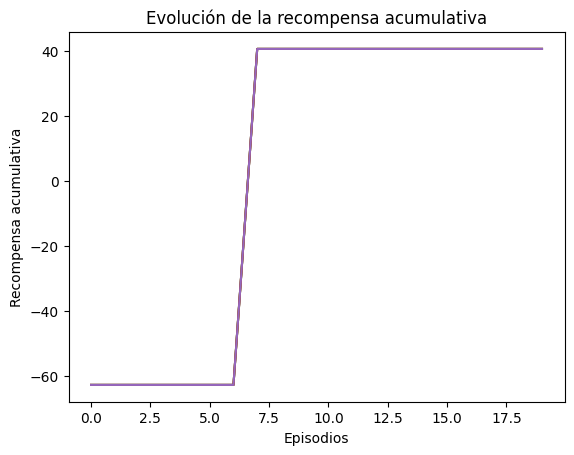

In [43]:
plt.plot(rewards)
plt.xlabel('Episodios')
plt.ylabel('Recompensa acumulativa')
plt.title('Evolución de la recompensa acumulativa')
plt.show()

## Conclusiones

Como conclusion obtengo que a traves de todas las pruebas se obtuvieron varios resultados muy buenos con recompensas de 40/41 cuando la recompensa final es 50 y atravesar todo el laberinto requeria 9 pasos. Por esto se puede concluir que las pruebas fueron exitosas. El siguiente paso es complejizar la clase agrandandola y añadiendo mas obstaculos.